In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

# Import the data

Now, the phone data:

In [3]:
acc = pd.read_csv('./../../Data_phone/pali-otthon/Accelerometer.csv',sep=',',header=0,names=['time','seconds_elapsed','acc_z','acc_y','acc_x'])
gyr = pd.read_csv('./../../Data_phone/pali-otthon/Gyroscope.csv',sep=',',header=0,names=['time','seconds_elapsed','gyr_z','gyr_y','gyr_x'])
#mag = pd.read_csv('./../../Data_phone/pali-otthon/Magnetometer.csv',sep=',',header=0,names=['time','seconds_elapsed','mag_z','mag_y','mag_x'])
loc = pd.read_csv('./../../Data_phone/pali-otthon/Location.csv',sep=',')

df_raw = pd.concat([acc, gyr[['gyr_z','gyr_y','gyr_x']]], axis=1) #Concat the vibration data """, mag[['mag_z','mag_y','mag_x']]"""

# Cleaning

### Interpolate the GPS data

In [4]:
loc_new = pd.DataFrame()
fp = loc['seconds_elapsed'] #interpolaciohoz: ismert adatpontok helye
x = df_raw['seconds_elapsed'] #interpolaciohoz: uj adatpontok helye

for j in ['latitude','longitude','speed']:
    xp = loc[j] #interpolaciohoz: eredeti y ertekek
    loc_new[j] = np.interp(x, fp, xp) 
    
df_raw = pd.concat([df_raw, loc_new], axis=1)
df_raw.rename(columns={"latitude":"lat", "longitude": "lon"}, inplace=True)

df_raw.head()

,time,seconds_elapsed,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed
0,1709479874816941300,0.030941,0.003924,-0.323628,-0.246644,-0.013459,0.080146,-0.007117,46.899863,16.857550,18.467588
1,1709479874826998300,0.040998,-0.285720,0.284784,-0.068226,-0.023030,0.055037,0.004746,46.899862,16.857549,18.467573
2,1709479874837056500,0.051056,0.692226,-0.024066,-0.644851,-0.013440,0.075295,-0.001381,46.899860,16.857549,18.467558
3,1709479874847114200,0.061114,-0.363028,-0.022247,-0.183344,-0.014847,0.065443,0.003200,46.899858,16.857548,18.467544
4,1709479874857171200,0.071171,0.338663,0.214720,0.074267,-0.026248,0.010992,0.013625,46.899856,16.857548,18.467529


### Trajectory smoothing

In [5]:
def moving_average(x, N=100):
    padded = np.pad(x, (N//2, N-1-N//2), mode='edge')
    return np.convolve(padded, np.ones((N,))/N, mode='valid')

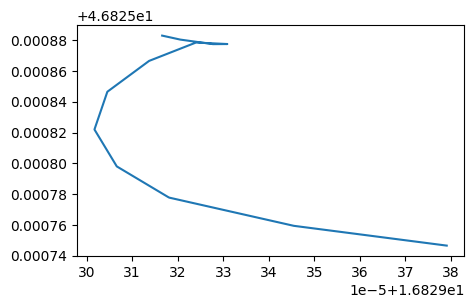

In [6]:
plt.figure(figsize=(5,3))
plt.plot(df_raw['lon'].to_numpy()[77000:], df_raw['lat'].to_numpy()[77000:])

In [7]:
df_raw['lon'] = moving_average(df_raw['lon'].copy().to_numpy())
df_raw['lat'] = moving_average(df_raw['lat'].copy().to_numpy())

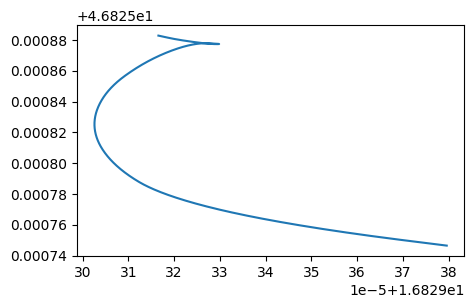

In [8]:
plt.figure(figsize=(5,3))
plt.plot(df_raw['lon'][77000:], df_raw['lat'][77000:])

### Spatial resampling

In [9]:
dDist = []
for j in np.arange(2,len(df_raw)):
    d = abs(np.arccos(np.cos(np.deg2rad(90-df_raw['lat'].loc[j-1])) * np.cos(np.deg2rad(90-df_raw['lat'].loc[j])) + np.sin(np.deg2rad(90-df_raw['lat'].loc[j-1])) * np.sin(np.deg2rad(90-df_raw['lat'].loc[j]))) * np.cos(np.deg2rad(df_raw['lon'].loc[j-1]-df_raw['lon'].loc[j])) * 3958.76);
    dDist.append(d)
df_raw_dDist = pd.DataFrame(dDist)
df_raw_dDist.fillna(0,inplace=True) #remove the NaN values, introduced from the above calculation
df_raw_dDist.isna().value_counts()

df_raw_dDist[0].replace(0, 0.000001, inplace=True) #correct the count error

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/3827963625.py:3: RuntimeWarning: invalid value encountered in arccos
  d = abs(np.arccos(np.cos(np.deg2rad(90-df['lat'].loc[j-1])) * np.cos(np.deg2rad(90-df['lat'].loc[j])) + np.sin(np.deg2rad(90-df['lat'].loc[j-1])) * np.sin(np.deg2rad(90-df['lat'].loc[j]))) * np.cos(np.deg2rad(df['lon'].loc[j-1]-df['lon'].loc[j])) * 3958.76);
/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/3827963625.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_dDist[

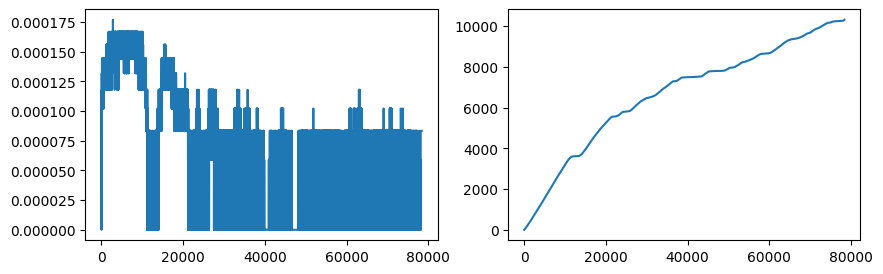

In [10]:
plt.figure(figsize=(10,3))
plt.subplot(121)
plt.plot(dDist)
plt.subplot(122)
plt.plot(np.cumsum(df_raw_dDist.to_numpy())*2200)

In [11]:
fs = 5

summed = np.cumsum(df_raw_dDist.to_numpy())*2200   #calculated the total travelled distance by cumsum function
uniqe_indexes = np.unique(summed,return_index=True)
x = np.arange(0,max(summed),1/fs)

# Then we use again the interp function to convert the time domain to the spatial domain
df_raw_spatial = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df_raw[j]
    df_raw_spatial[j] = np.interp(x,uniqe_indexes[0],xp[uniqe_indexes[1]])


In [12]:
from scipy.interpolate import CubicSpline

In [13]:
df_raw_spatial_spline = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df_raw[j][:-2]
    cs = CubicSpline(summed,xp)
    df_raw_spatial_spline[j] = cs(x)

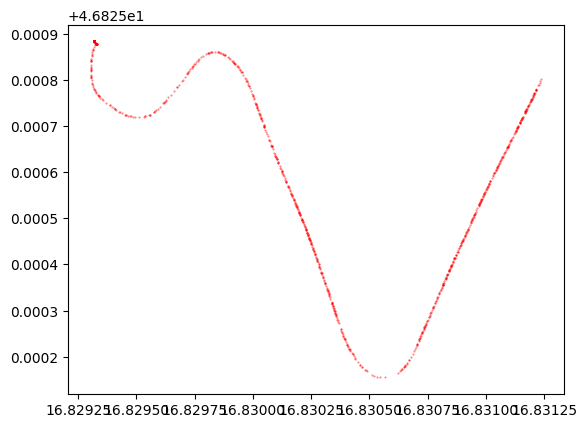

In [14]:
plt.plot(df_raw_spatial_spline['lon'][50500:],df_raw_spatial_spline['lat'][50500:], 'r.', markersize=1, alpha=0.5)

<Axes: xlabel='lon', ylabel='lat'>

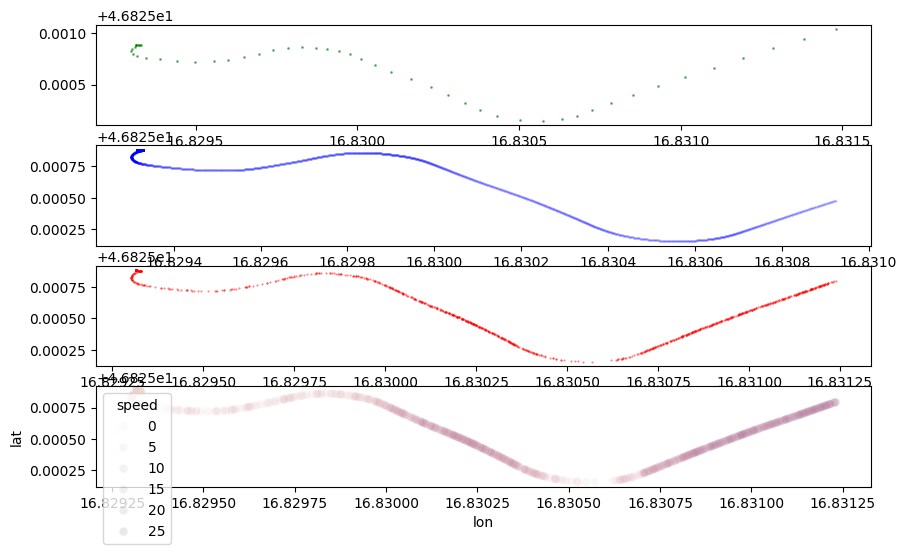

In [15]:
# Check the results
plt.figure(figsize=(10,6))
plt.subplot(411)
plt.plot(loc['longitude'][740:],loc['latitude'][740:], 'g.', markersize=2, alpha=0.5)
plt.subplot(412)
plt.plot(df_raw['lon'][74000:],df_raw['lat'][74000:], 'b.', markersize=2, alpha=0.05)
plt.subplot(413)
plt.plot(df_raw_spatial_spline['lon'][50500:],df_raw_spatial_spline['lat'][50500:], 'r.', markersize=1, alpha=0.5)
plt.subplot(414)
sns.scatterplot(x=df_raw_spatial['lon'][50500:],y=df_raw_spatial['lat'][50500:], hue=df_raw_spatial['speed'],alpha=0.1)

<Figure size 400x400 with 0 Axes>

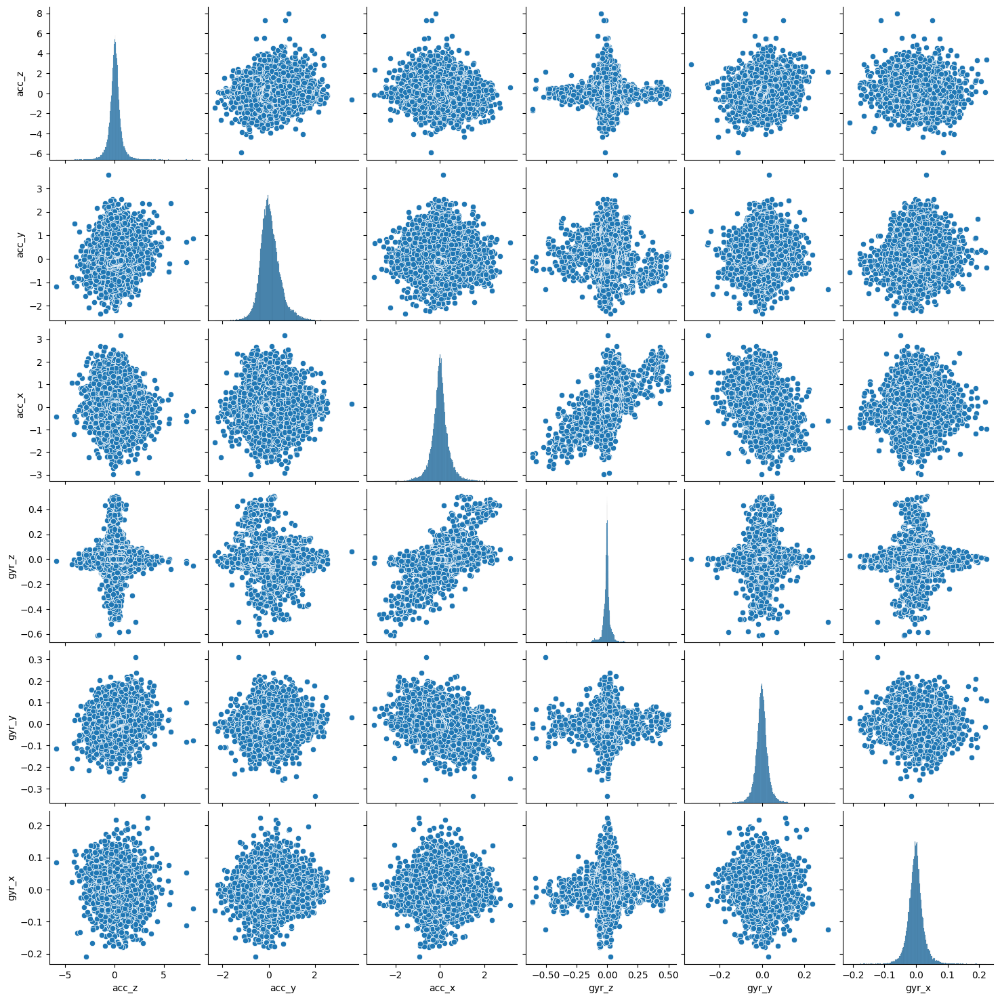

In [16]:
plt.figure(figsize=(4,4))
sns.pairplot(data=df_raw_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

### Normalization

In [17]:
from sklearn.preprocessing import normalize

In [18]:
df_raw_normalized = pd.DataFrame(normalize(df_raw_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']], norm='max', axis=0))
df_raw_normalized.columns = ['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']

df_raw_normalized['lat'] = df_raw_spatial['lat']
df_raw_normalized['lon'] = df_raw_spatial['lon']
df_raw_normalized['speed'] = df_raw_spatial['speed']
df_raw_normalized['time'] = df_raw_spatial['time']
df_raw_normalized['seconds_elapsed'] = df_raw_spatial['seconds_elapsed']

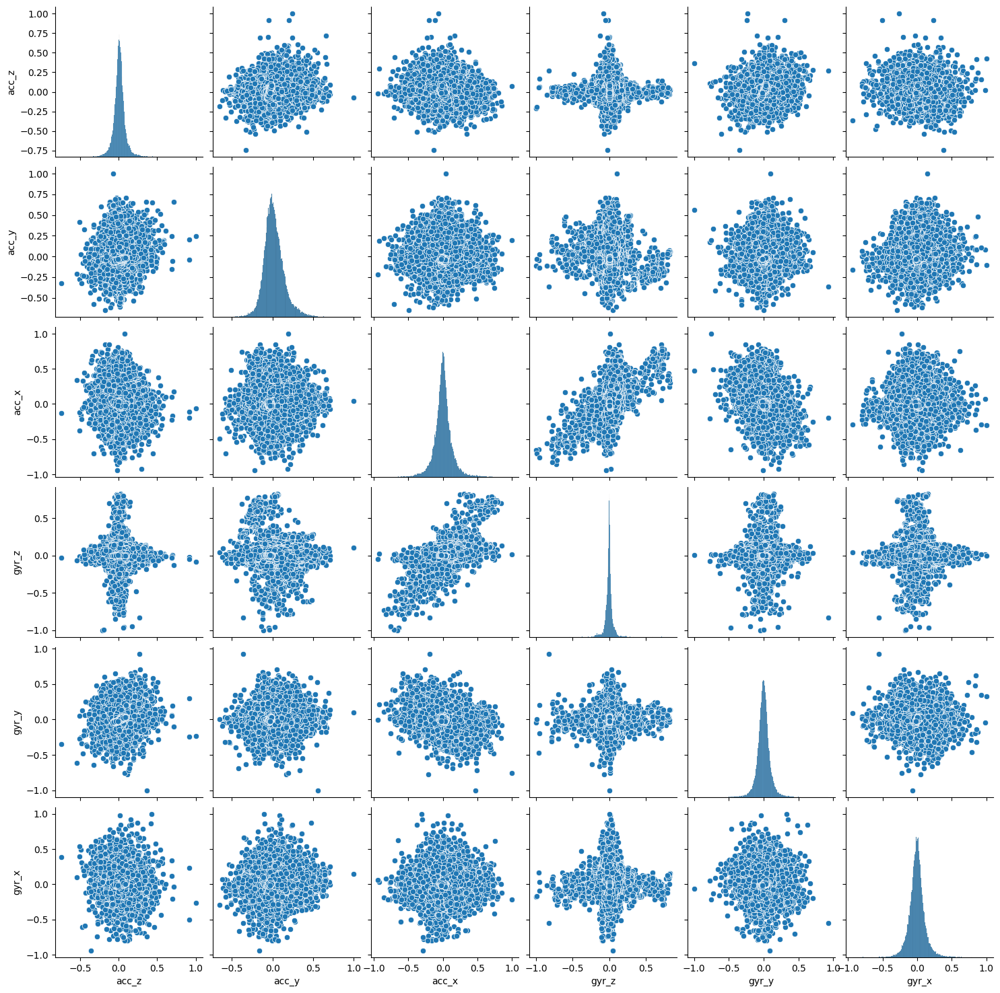

In [19]:
sns.pairplot(data=df_raw_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

# Feature extraction

In [20]:
df_raw_spatial.describe()

,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed,time,seconds_elapsed
count,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,5.157600e+04,51576.000000
mean,0.072669,0.066874,0.006531,-0.002707,-0.000654,-0.001125,46.863987,16.848779,16.690873,1.709480e+18,278.611109
std,0.605351,0.447443,0.413690,0.042370,0.030680,0.025371,0.021684,0.007114,6.081154,2.303782e+11,230.378226
min,-5.909624,-2.324377,-2.981962,-0.609738,-0.334334,-0.209880,46.825155,16.829303,0.000000,1.709480e+18,0.030941
25%,-0.225516,-0.213366,-0.191050,-0.013389,-0.016578,-0.014666,46.846081,16.843661,11.689959,1.709480e+18,81.227278
50%,0.066423,0.022404,0.003535,-0.001478,-0.000779,-0.001255,46.865339,16.853099,16.100736,1.709480e+18,196.711583
75%,0.352594,0.303211,0.196450,0.008356,0.014831,0.011684,46.882735,16.853597,22.961514,1.709480e+18,450.838424
max,7.971501,3.585666,3.169476,0.505261,0.310204,0.223573,46.899842,16.857543,25.752999,1.709481e+18,788.281128


In [21]:
df_raw_normalized.describe()

,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed,time,seconds_elapsed
count,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,51576.000000,5.157600e+04,51576.000000
mean,0.009116,0.018650,0.002061,-0.004440,-0.001956,-0.005030,46.863987,16.848779,16.690873,1.709480e+18,278.611109
std,0.075939,0.124787,0.130523,0.069488,0.091765,0.113480,0.021684,0.007114,6.081154,2.303782e+11,230.378226
min,-0.741344,-0.648241,-0.940837,-1.000000,-1.000000,-0.938754,46.825155,16.829303,0.000000,1.709480e+18,0.030941
25%,-0.028290,-0.059505,-0.060278,-0.021959,-0.049584,-0.065597,46.846081,16.843661,11.689959,1.709480e+18,81.227278
50%,0.008333,0.006248,0.001115,-0.002424,-0.002330,-0.005615,46.865339,16.853099,16.100736,1.709480e+18,196.711583
75%,0.044232,0.084562,0.061982,0.013705,0.044359,0.052261,46.882735,16.853597,22.961514,1.709480e+18,450.838424
max,1.000000,1.000000,1.000000,0.828653,0.927826,1.000000,46.899842,16.857543,25.752999,1.709481e+18,788.281128


<Axes: >

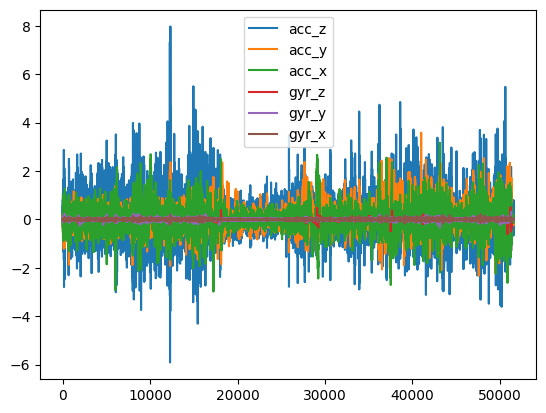

In [22]:
df_raw_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot()

<Axes: >

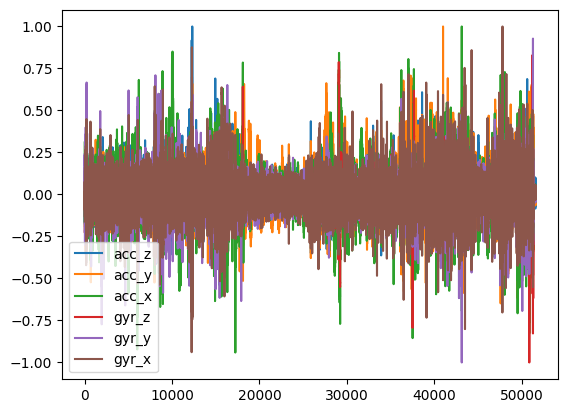

In [23]:
df_raw_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot()

### Spectrogram

In [24]:
from scipy import signal

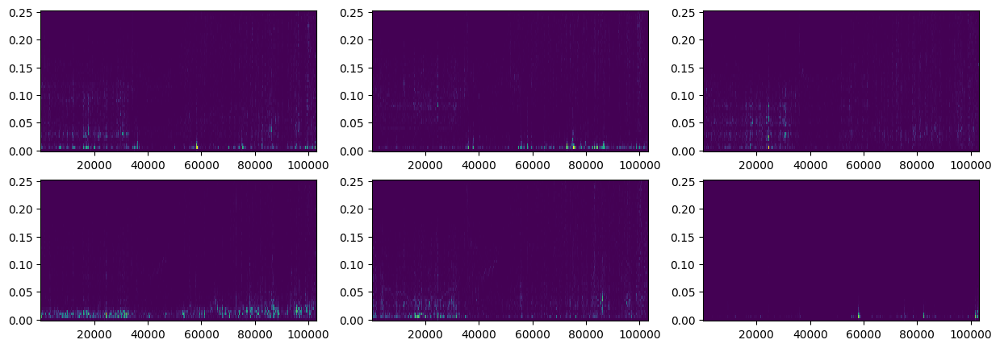

In [25]:
fs = 0.5

plt.figure(figsize=(15,5))
plt.subplot(231)
f, t, Sxx = signal.spectrogram(df_raw_normalized['acc_x'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(232)
f, t, Sxx = signal.spectrogram(df_raw_normalized['acc_y'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(233)
f, t, Sxx = signal.spectrogram(df_raw_normalized['acc_z'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')

plt.subplot(234)
f, t, Sxx = signal.spectrogram(df_raw_normalized['gyr_x'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(235)
f, t, Sxx = signal.spectrogram(df_raw_normalized['gyr_y'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')
plt.subplot(236)
f, t, Sxx = signal.spectrogram(df_raw_normalized['gyr_z'], fs, nperseg=100, noverlap=30)
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')

In [26]:
import matplotlib.scale as scl
scl.get_scale_names()

['asinh', 'function', 'functionlog', 'linear', 'log', 'logit', 'symlog']

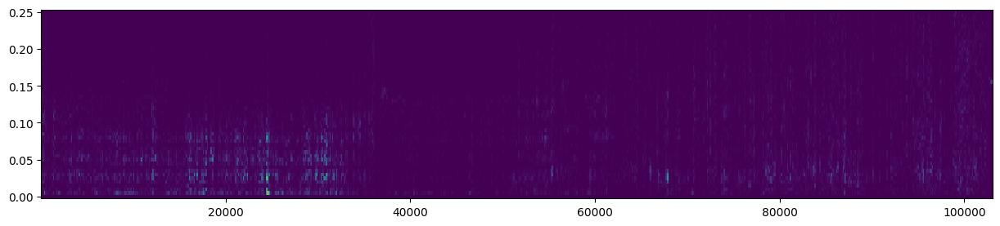

In [27]:
f, t, Sxx = signal.spectrogram(df_raw_normalized['acc_z'], fs, nperseg=100, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='asinh')

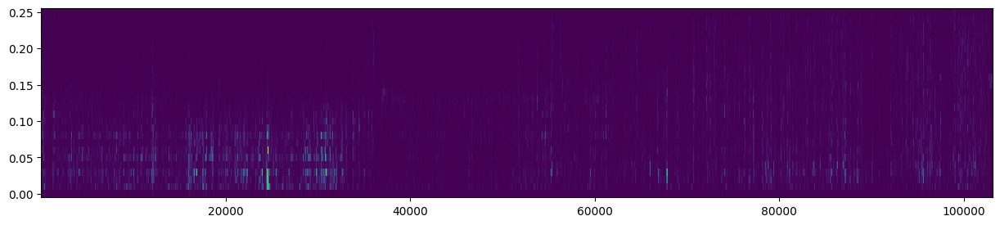

In [28]:
f, t, Sxx = signal.spectrogram(df_raw_normalized['acc_z'], fs, nperseg=50, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='asinh')

In [29]:
Sxx.shape

(26, 2577)

'norm=\'symlog\' --> A quasi-logarithmic scale based on the inverse hyperbolic sine (asinh)\n\n    For values close to zero, this is essentially a linear scale,\n    but for large magnitude values (either positive or negative)\n    it is asymptotically logarithmic. The transition between these\n    linear and logarithmic regimes is smooth, and has no discontinuities\n    in the function gradient in contrast to\n    the `.SymmetricalLogScale` ("symlog") scale.'

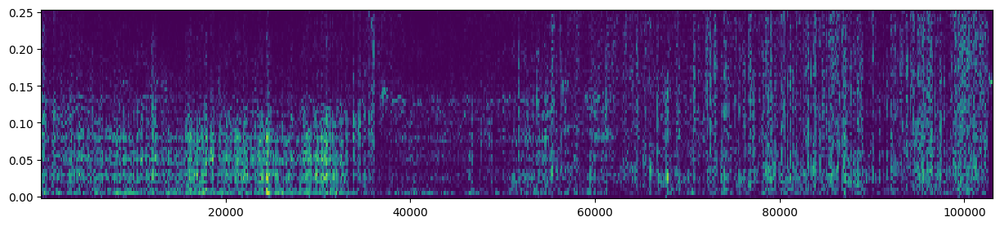

In [30]:
f, t, Sxx = signal.spectrogram(df_raw_spatial['acc_z'], fs, nperseg=100, noverlap=30)
plt.figure(figsize=(15,3))
plt.pcolormesh(t, f, Sxx, shading='nearest', rasterized=True, alpha=1, norm='symlog')


"""norm='symlog' --> A quasi-logarithmic scale based on the inverse hyperbolic sine (asinh)

    For values close to zero, this is essentially a linear scale,
    but for large magnitude values (either positive or negative)
    it is asymptotically logarithmic. The transition between these
    linear and logarithmic regimes is smooth, and has no discontinuities
    in the function gradient in contrast to
    the `.SymmetricalLogScale` ("symlog") scale."""

### Sum the Y axis

In [31]:
df_raw_sum_spectrum = pd.DataFrame()
for var in ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']:
    f, t, Sxx = signal.spectrogram(df_raw_normalized[var], 5, nperseg=50, noverlap=30) # here I use 5 Hz for fs    ### or nperseg=100 ???
    new_row = np.sum(Sxx, axis=0)
    df_raw_sum_spectrum = pd.concat([df_raw_sum_spectrum, pd.DataFrame([new_row]).T], ignore_index=True, axis=1)

df_raw_sum_spectrum.columns = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']

In [32]:
df_raw_sum_spectrum

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227
...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099


<Axes: >

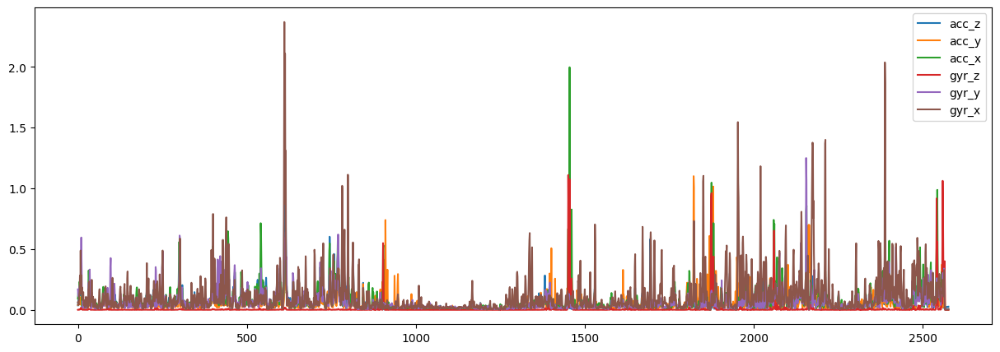

In [33]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111)
df_raw_sum_spectrum[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']].plot(ax=ax)

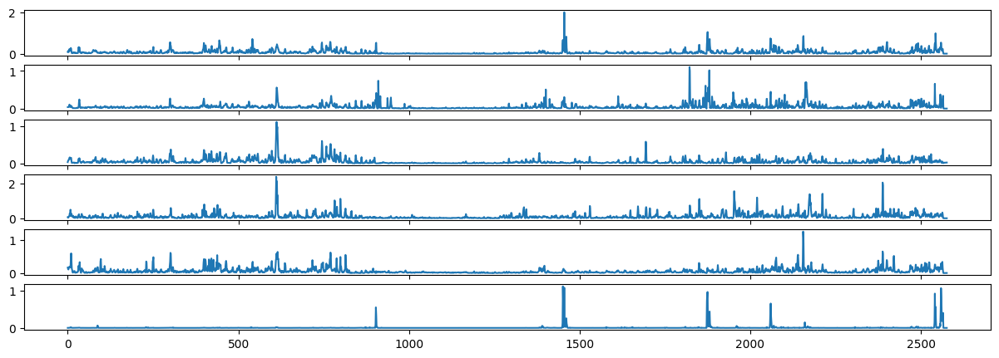

In [34]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(611)
plt.plot(df_raw_sum_spectrum['acc_x'])
ax = fig.add_subplot(612)
plt.plot(df_raw_sum_spectrum['acc_y'])
ax = fig.add_subplot(613)
plt.plot(df_raw_sum_spectrum['acc_z'])
ax = fig.add_subplot(614)
plt.plot(df_raw_sum_spectrum['gyr_x'])
ax = fig.add_subplot(615)
plt.plot(df_raw_sum_spectrum['gyr_y'])
ax = fig.add_subplot(616)
plt.plot(df_raw_sum_spectrum['gyr_z'])

In [35]:
# Interpolate the GPS data to fit for the spectrum data size

for j in ['lat','lon']:
    xp = df_raw[j][:-2]
    cs = CubicSpline(summed,xp)
    df_raw_sum_spectrum[j] = cs(t)

In [36]:
df_raw_sum_spectrum

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,lat,lon
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948,46.899810,16.857534
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080,46.899785,16.857527
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499,46.899758,16.857519
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943,46.899730,16.857511
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227,46.899703,16.857503
...,...,...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081,46.825883,16.829317
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072,46.825883,16.829317
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075,46.825883,16.829317
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099,46.825883,16.829317


In [37]:
df_raw_sum_spectrum['acc_z'].describe()

count    2577.000000
mean        0.054378
std         0.073751
min         0.002053
25%         0.015053
50%         0.030470
75%         0.064452
max         1.112158
Name: acc_z, dtype: float64

In [38]:
df_raw_sum_spectrum[df_raw_sum_spectrum['acc_z'] < 1]

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,lat,lon
0,0.092817,0.041295,0.037039,0.062556,0.168981,0.000948,46.899810,16.857534
1,0.142495,0.039715,0.071338,0.068183,0.125444,0.002080,46.899785,16.857527
2,0.091306,0.042550,0.087419,0.039939,0.111203,0.001499,46.899758,16.857519
3,0.088197,0.043697,0.094993,0.084212,0.144118,0.000943,46.899730,16.857511
4,0.148661,0.061805,0.125346,0.126382,0.179541,0.001227,46.899703,16.857503
...,...,...,...,...,...,...,...,...
2572,0.005696,0.001989,0.023025,0.002322,0.005204,0.000081,46.825883,16.829317
2573,0.006393,0.001949,0.025849,0.002568,0.005734,0.000072,46.825883,16.829317
2574,0.007054,0.001860,0.025985,0.002444,0.005760,0.000075,46.825883,16.829317
2575,0.008582,0.001776,0.026898,0.002359,0.006438,0.000099,46.825883,16.829317


<Axes: ylabel='Frequency'>

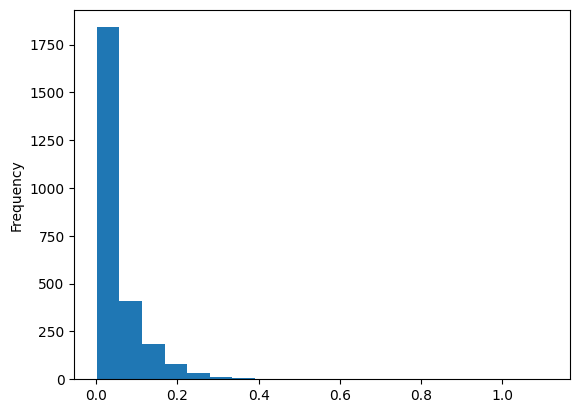

In [39]:
df_raw_sum_spectrum['acc_z'].plot(kind='hist', bins=20)

In [40]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum[df_raw_sum_spectrum['acc_z'] < 0.2]['lat'], lon=df_raw_sum_spectrum[df_raw_sum_spectrum['acc_z'] < 0.2]['lon'], color= df_raw_sum_spectrum[df_raw_sum_spectrum['acc_z'] < 0.2]['acc_x'], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

<Axes: >

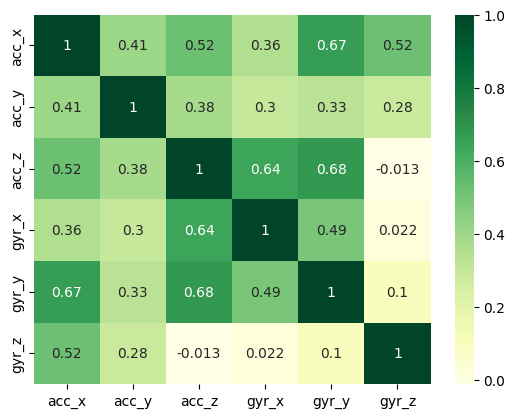

In [41]:
sns.heatmap(df_raw_sum_spectrum[['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']].corr(), annot=True, cmap='YlGn')

### Aggressive maneuver detection

In [42]:
from scipy.signal import find_peaks

In [43]:
# Aggressive maneuver are represented by the acc_x and the gyr_z variables
    # See the above correlation map
    # And the sensor orientation
    
df_raw_sum_spectrum[['acc_x','gyr_z']].describe()

,acc_x,gyr_z
count,2577.000000,2577.000000
mean,0.076969,0.008767
std,0.104833,0.064614
min,0.001898,0.000072
25%,0.021333,0.000394
50%,0.043506,0.000765
75%,0.088197,0.002069
max,1.997212,1.109905


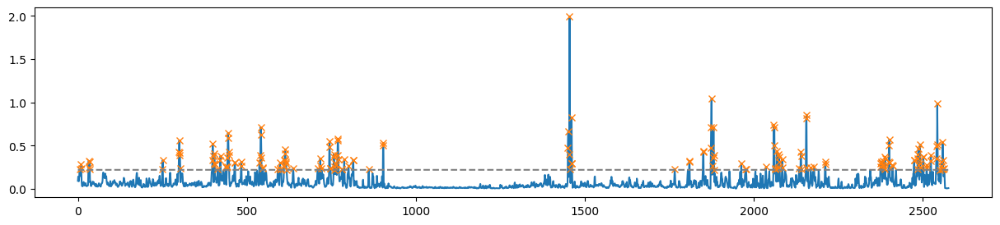

In [44]:
# Find aggressive turnings in acc_x
#peaks_accx, _ = find_peaks(df_raw_sum_spectrum['acc_x'], height=0.22)
peaks_accx = df_raw_sum_spectrum[df_raw_sum_spectrum['acc_x'] > 0.22].index

plt.figure(figsize=(15,3))
plt.plot(df_raw_sum_spectrum['acc_x'])
plt.plot(peaks_accx, df_raw_sum_spectrum['acc_x'][peaks_accx], "x")
plt.plot(np.zeros_like(df_raw_sum_spectrum['acc_x'])+0.22, "--", color="gray")
plt.show()

In [45]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'][peaks_accx], lon=df_raw_sum_spectrum['lon'][peaks_accx], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

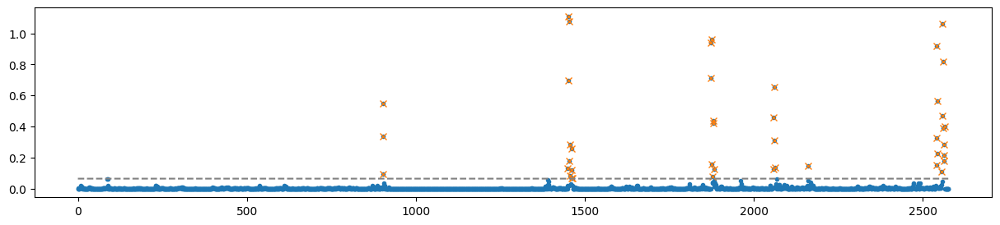

In [46]:
# Find aggressive turnings in gyr_z

#peaks_gyrz, _ = find_peaks(df_raw_sum_spectrum['gyr_z'], height = np.std(df_raw_sum_spectrum['gyr_z']), distance=1)
peaks_gyrz = df_raw_sum_spectrum[df_raw_sum_spectrum['gyr_z'] > np.std(df_raw_sum_spectrum['gyr_z'])].index

plt.figure(figsize=(15,3))
plt.plot(df_raw_sum_spectrum['gyr_z'],'.')
plt.plot(peaks_gyrz, df_raw_sum_spectrum['gyr_z'][peaks_gyrz], "x")
plt.plot(np.zeros_like(df_raw_sum_spectrum['gyr_z']) + np.std(df_raw_sum_spectrum['gyr_z']), "--", color="gray")
plt.show()

In [47]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'][peaks_gyrz], lon=df_raw_sum_spectrum['lon'][peaks_gyrz], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

In [48]:
peaks = pd.concat([pd.DataFrame(peaks_accx), pd.DataFrame(peaks_gyrz)], join="outer", ignore_index=True).drop_duplicates()[0]
peaks # Location indexes of aggressive turnings

0         5
1         9
2        10
3        32
4        33
       ... 
203    2160
206    2542
214    2562
215    2563
217    2565
Name: 0, Length: 187, dtype: int64

In [49]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'][peaks], lon=df_raw_sum_spectrum['lon'][peaks], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

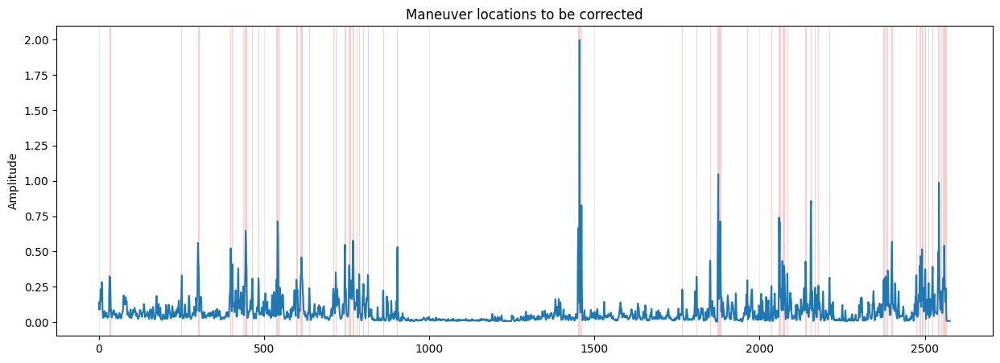

In [50]:
ax = df_raw_sum_spectrum['acc_x'].plot(figsize=(15, 5), use_index=False, ylabel='Amplitude')
ax.grid(axis='x', alpha=0.3)
plt.title('Maneuver locations to be corrected')

# Highlight aggressive turning maneuvers
for peak in zip(peaks):
    ax.axvspan(peak[0], peak[0]+1, facecolor='red', alpha=.2)

#### Correction

In [51]:
df_raw_sum_spectrum_corrected = df_raw_sum_spectrum.copy()

In [52]:
df_raw_sum_spectrum_corrected['acc_x'][peaks] = df_raw_sum_spectrum['acc_x'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/746328853.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




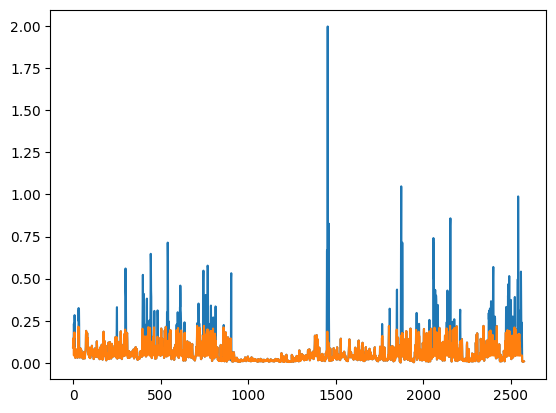

In [53]:
plt.plot(df_raw_sum_spectrum['acc_x'])
plt.plot(df_raw_sum_spectrum_corrected['acc_x'])

In [54]:
df_raw_sum_spectrum_corrected['gyr_z'].loc[peaks] = df_raw_sum_spectrum['gyr_z'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/475576752.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




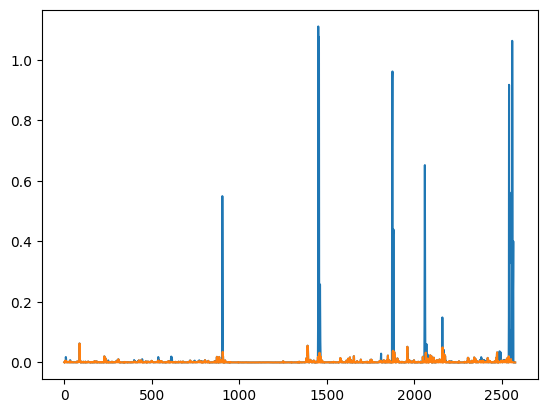

In [55]:
plt.plot(df_raw_sum_spectrum['gyr_z'])
plt.plot(df_raw_sum_spectrum_corrected['gyr_z'])

# New section

In [56]:
df_raw_sum_spectrum_corrected.columns

Index(['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z', 'lat', 'lon'], dtype='object')

<Axes: ylabel='Frequency'>

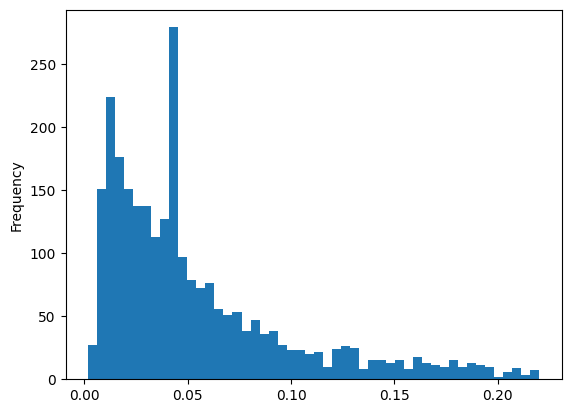

In [57]:
# skewed data, lognormal distribution

df_raw_sum_spectrum_corrected['acc_x'].plot(kind='hist', bins=50)

- with PowerTransformer

In [58]:
from sklearn.preprocessing import MinMaxScaler

In [59]:
scaler = MinMaxScaler(feature_range=(0.0000000001,1))
df_raw_scaled = scaler.fit_transform(df_raw_sum_spectrum_corrected[['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']])

In [60]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='box-cox', standardize=False)
df_raw_rescaled = pt.fit_transform(df_raw_scaled)
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html#sklearn.preprocessing.PowerTransformer
# https://scikit-learn.org/stable/modules/preprocessing.html

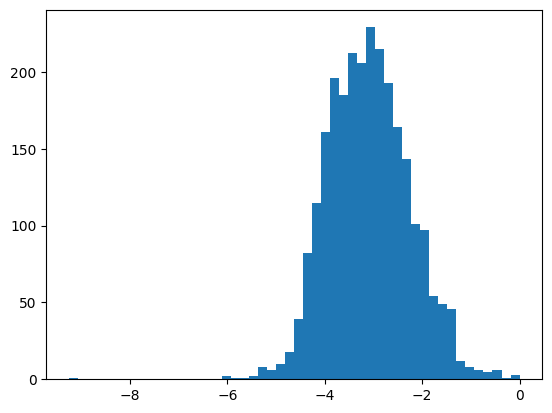

In [61]:
plt.hist(df_raw_rescaled[:,3], bins=50);  #acc_z axis

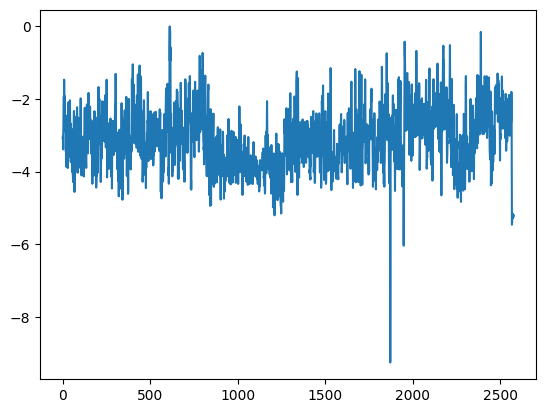

In [62]:
plt.plot(df_raw_rescaled[:,3])

- with standard deviation based outlier removal

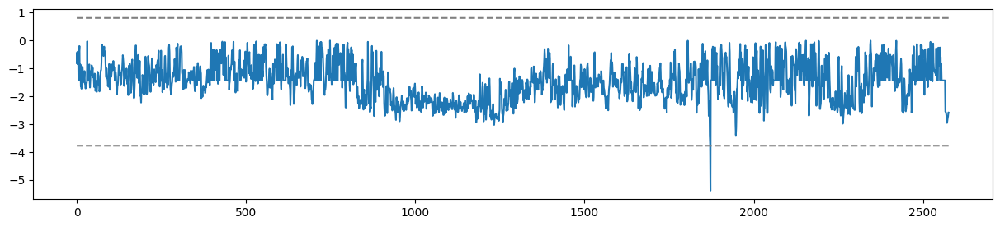

In [63]:
plt.figure(figsize=(15,3))
plt.plot(df_raw_rescaled[:,0])
plt.plot((np.zeros_like(df_raw_rescaled[:,0])+df_raw_rescaled[:,0].mean()) + df_raw_rescaled[:,0].std()*3.5, "--", color="gray")
plt.plot((np.zeros_like(df_raw_rescaled[:,0])+df_raw_rescaled[:,0].mean()) - df_raw_rescaled[:,0].std()*3.5, "--", color="gray")
plt.show()

In [64]:
pd.DataFrame(df_raw_rescaled)

,0,1,2,3,4,5
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712
...,...,...,...,...,...,...
2572,-2.859729,-5.080092,-3.325959,-5.243603,-4.756296,-7.501328
2573,-2.778249,-5.095397,-3.237691,-5.172530,-4.636259,-15.389790
2574,-2.710008,-5.130247,-3.233699,-5.207230,-4.630913,-8.315934
2575,-2.576098,-5.165266,-3.207332,-5.232288,-4.506049,-6.712545


In [65]:
df_raw_outliers_removed = pd.DataFrame(df_raw_rescaled).copy()
for vars in df_raw_outliers_removed:
    df_raw_outliers_removed[vars][df_raw_outliers_removed[vars] > (df_raw_outliers_removed[vars].mean() + df_raw_outliers_removed[vars].std()*3.5)] = (df_raw_outliers_removed[vars].mean() + df_raw_outliers_removed[vars].std()*3.5)
    df_raw_outliers_removed[vars][df_raw_outliers_removed[vars] < (df_raw_outliers_removed[vars].mean() - df_raw_outliers_removed[vars].std()*3.5)] = (df_raw_outliers_removed[vars].mean() - df_raw_outliers_removed[vars].std()*3.5)

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/3484797227.py:3: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_75722/3484797227.py:4: FutureWarning:

ChainedAssignme

In [66]:
df_raw_outliers_removed.describe()

,0,1,2,3,4,5
count,2577.000000,2577.000000,2577.000000,2577.000000,2577.000000,2577.000000
mean,-1.479134,-3.068788,-3.067007,-3.087306,-2.952339,-4.096648
std,0.652217,0.730719,0.799272,0.833095,0.753822,1.039827
min,-3.772866,-5.671769,-5.894910,-6.028372,-5.622657,-7.815250
25%,-1.952613,-3.599589,-3.650901,-3.702272,-3.471105,-4.779346
50%,-1.428735,-3.144318,-3.111991,-3.106434,-3.036875,-4.142829
75%,-1.049843,-2.637402,-2.529495,-2.546767,-2.464399,-3.528822
max,0.000000,-0.462231,-0.239845,-0.147814,-0.282869,-0.377003


In [67]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'], lon=df_raw_sum_spectrum['lon'], color = df_raw_outliers_removed[3], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

# Segmentation

In [68]:
import ruptures as rpt

In [69]:
# detection with https://centre-borelli.github.io/ruptures-docs/code-reference/detection/pelt-reference/ 

#algo = rpt.Dynp(model="l2").fit(df_raw_outliers_removed[0].to_numpy())
#result = algo.predict(n_bkps=40)

algo = rpt.Pelt().fit(df_raw_outliers_removed[2].to_numpy())
result = algo.predict(1) #original pen=1
result[:5]

[10, 20, 30, 35, 75]

<Axes: >

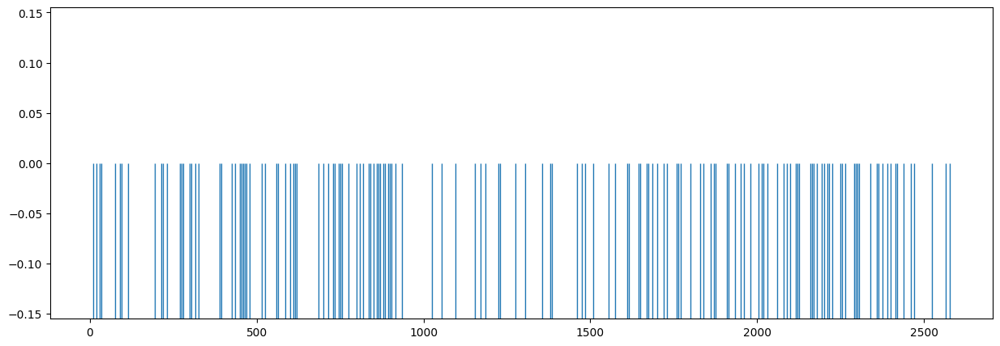

In [156]:
# Plot the section boudaries
plt.figure(figsize=(15,5))
sns.rugplot(result, height=0.5)

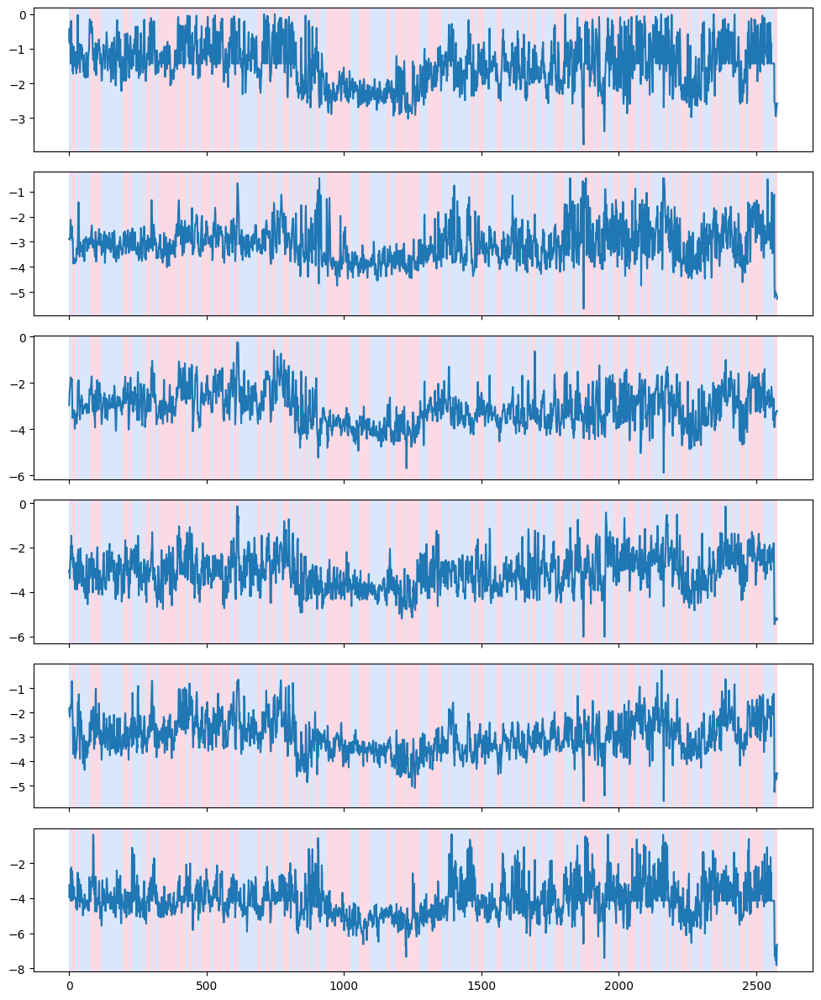

In [70]:
# display segmentation
rpt.display(df_raw_outliers_removed.to_numpy(), result)
plt.show()

In [71]:
from scipy import stats

def calculate_mean_vector(df_raw, breakpoints): #mean
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.mean()
        vector[start:end] = value
    return vector

def calculate_var_vector(df_raw, breakpoints): #variance
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.var()
        vector[start:end] = value
    return vector

def calculate_std_vector(df_raw, breakpoints): #std
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.std()
        vector[start:end] = value
    return vector

def calculate_median_vector(df_raw, breakpoints): #median
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.median()
        vector[start:end] = value
    return vector

#rms
#rms = np.sqrt(np.mean(y**2))
def calculate_rms_vector(df_raw, breakpoints): #median
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = np.sqrt(np.mean(segment**2))
        vector[start:end] = value
    return vector


def calculate_entropy_vector(df_raw, breakpoints): #entropy
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = stats.entropy(segment)
        vector[start:end] = value
    return vector

def calculate_kurtosis_vector(df_raw, breakpoints): #kurtosis
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = stats.kurtosis(segment)
        vector[start:end] = value
    return vector


def calculate_len_vector(df_raw, breakpoints): #length
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = len(segment)
        vector[start:end] = value
    return vector

def calculate_spikiness_vector(df_raw, breakpoints): #spikiness
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = np.var(np.diff(segment))
        vector[start:end] = value
    return vector

import statsmodels.api as sm

def calculate_stability_vector(df_raw, breakpoints): #spikiness
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = np.median(sm.tsa.acf(segment, nlags=10))
        vector[start:end] = value
    return vector

In [72]:
df_raw_outliers_removed.columns = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']

In [73]:
df_raw_outliers_removed

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712
...,...,...,...,...,...,...
2572,-2.859729,-5.080092,-3.325959,-5.243603,-4.756296,-7.501328
2573,-2.778249,-5.095397,-3.237691,-5.172530,-4.636259,-7.815250
2574,-2.710008,-5.130247,-3.233699,-5.207230,-4.630913,-7.815250
2575,-2.576098,-5.165266,-3.207332,-5.232288,-4.506049,-6.712545


In [105]:
# Generate new values for feature space
"""
df_raw_features = df_raw_outliers_removed.copy()
df_raw_features['mean'] = calculate_mean_vector(df_raw_outliers_removed[2], result)
df_raw_features['std'] = calculate_std_vector(df_raw_outliers_removed[2], result)
df_raw_features['var'] = calculate_var_vector(df_raw_outliers_removed[2], result)
df_raw_features['median'] = calculate_median_vector(df_raw_outliers_removed[2], result)
df_raw_features['rms'] = calculate_rms_vector(df_raw_outliers_removed[2], result)
df_raw_features['kurtosis'] = calculate_kurtosis_vector(df_raw_outliers_removed[2], result)
df_raw_features['length'] = calculate_len_vector(df_raw_outliers_removed[2], result)
df_raw_features['spikiness'] = calculate_spikiness_vector(df_raw_outliers_removed[2], result)
df_raw_features['stability'] = calculate_stability_vector(df_raw_outliers_removed[2], result)
"""

In [74]:
# Calculate std and median features for all variables, as these features were the most representative of the information content 

df_raw_features = pd.DataFrame()
for i in ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']:
    df_raw_features['std_' + i] = calculate_std_vector(df_raw_outliers_removed[i], result)
    df_raw_features['median_' + i] = calculate_median_vector(df_raw_outliers_removed[i], result)
df_raw_features = df_raw_features.iloc[10:]

<Axes: >

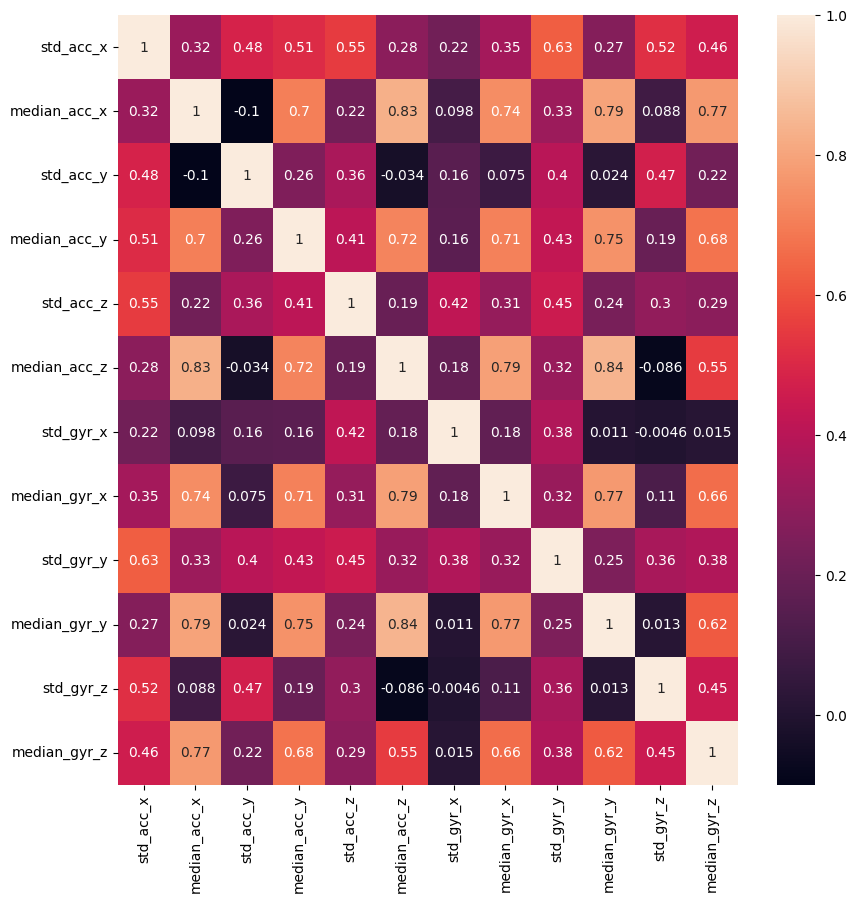

In [75]:
plt.figure(figsize=(10,10))
sns.heatmap(df_raw_features.corr(), annot=True)

In [76]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = df_raw_features['median_acc_z'], zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn_r)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

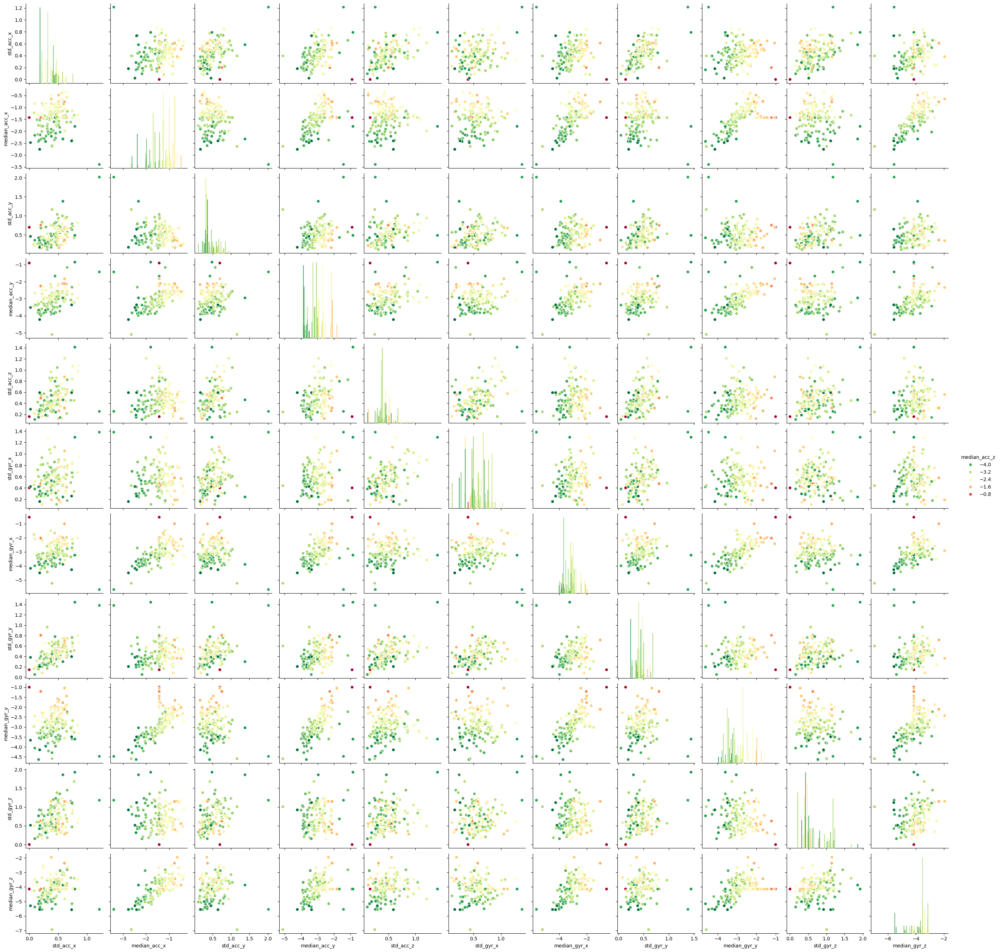

In [77]:
sns.pairplot(data = df_raw_features, hue = 'median_acc_z', palette='RdYlGn_r')

In [78]:
sns.scatterplot(data = df_raw_features, x='std',y='mean', hue='median', alpha=0.1, palette='RdYlGn_r')
#sns.jointplot(x=df_raw_features['mean'], y=df_raw_features['std'], kind='kde')
#plt.colorbar()

ValueError: Could not interpret value `std` for `x`. An entry with this name does not appear in `data`.

#### Export the data (for safety saving)

In [178]:
to_export = pd.DataFrame([df_raw_sum_spectrum['lat'].iloc[10:], df_raw_sum_spectrum['lon'].iloc[10:]]).T
to_export = pd.concat([to_export, df_raw_features], axis=1)
to_export

,lat,lon,std_acc_x,median_acc_x,std_acc_y,median_acc_y,std_acc_z,median_acc_z,std_gyr_x,median_gyr_x,std_gyr_y,median_gyr_y,std_gyr_z,median_gyr_z
10,46.899545,16.857459,0.310395,-1.433575,0.526610,-3.501934,0.512330,-3.243056,0.486218,-2.601420,0.963732,-2.656786,0.567705,-3.533258
11,46.899518,16.857452,0.310395,-1.433575,0.526610,-3.501934,0.512330,-3.243056,0.486218,-2.601420,0.963732,-2.656786,0.567705,-3.533258
12,46.899491,16.857444,0.310395,-1.433575,0.526610,-3.501934,0.512330,-3.243056,0.486218,-2.601420,0.963732,-2.656786,0.567705,-3.533258
13,46.899465,16.857437,0.310395,-1.433575,0.526610,-3.501934,0.512330,-3.243056,0.486218,-2.601420,0.963732,-2.656786,0.567705,-3.533258
14,46.899439,16.857430,0.310395,-1.433575,0.526610,-3.501934,0.512330,-3.243056,0.486218,-2.601420,0.963732,-2.656786,0.567705,-3.533258
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,46.825883,16.829317,0.394968,-2.637965,1.164551,-5.098054,0.243903,-3.314849,0.441171,-5.232912,0.599709,-4.591013,1.007636,-6.935956
2573,46.825883,16.829317,0.394968,-2.637965,1.164551,-5.098054,0.243903,-3.314849,0.441171,-5.232912,0.599709,-4.591013,1.007636,-6.935956
2574,46.825883,16.829317,0.394968,-2.637965,1.164551,-5.098054,0.243903,-3.314849,0.441171,-5.232912,0.599709,-4.591013,1.007636,-6.935956
2575,46.825883,16.829317,0.394968,-2.637965,1.164551,-5.098054,0.243903,-3.314849,0.441171,-5.232912,0.599709,-4.591013,1.007636,-6.935956


In [597]:
to_export.to_csv('./../../Data_phone/processed_bf_unsup_fit.csv', index=False)

In [602]:
len(to_export['quality'].unique())

207

## PCA

[0.69643346 0.81039665 0.86010919 0.9004937  0.9293113  0.95152386
 0.96556721 0.97870408 0.98593474 0.99181016 0.99719749 1.        ]


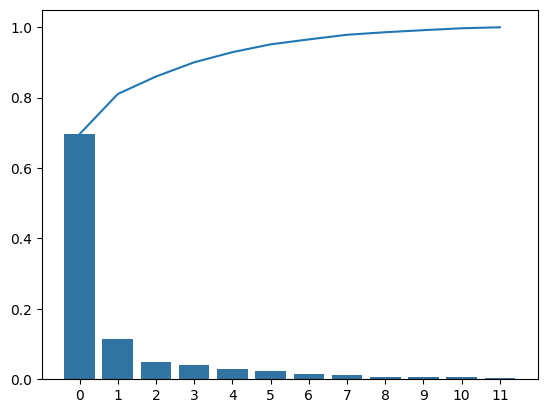

In [79]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(df_raw_features)
df_raw_pca = pd.DataFrame(pca.transform(df_raw_features))

sns.barplot(x=np.arange(0,len(pca.explained_variance_ratio_)),y=pca.explained_variance_ratio_)
plt.plot(pca.explained_variance_ratio_.cumsum())

print(pca.explained_variance_ratio_.cumsum())

Text(0.5, 1.0, 'Figure 1')

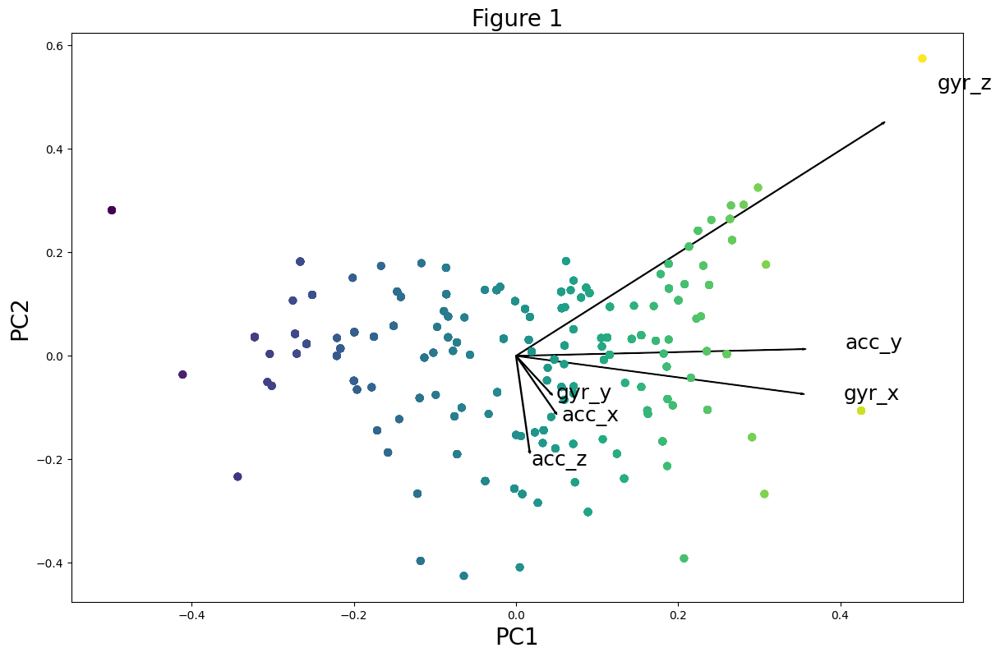

In [80]:
# Biplot
scalePC1 = 1.0/(df_raw_pca[0].max() - df_raw_pca[0].min())
scalePC2 = 1.0/(df_raw_pca[1].max() - df_raw_pca[1].min())
ldngs = pca.components_

fig, ax = plt.subplots(figsize=(14, 9))
for i, feature in enumerate(['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']):
    ax.arrow(0, 0, ldngs[0, i], 
             ldngs[1, i])
    ax.text(ldngs[0, i] * 1.15, 
            ldngs[1, i] * 1.15, 
            feature, fontsize=18)
 
ax.scatter(df_raw_pca[0] * scalePC1,df_raw_pca[1] * scalePC2, c=df_raw_pca[0])
 
ax.set_xlabel('PC1', fontsize=20)
ax.set_ylabel('PC2', fontsize=20)
ax.set_title('Figure 1', fontsize=20)

In [81]:
# Reduce the number of dimensions to 4

df_raw_pca.drop(labels=np.linspace(4,11,8), axis=1, inplace=True)

(-2.0, 4.0)

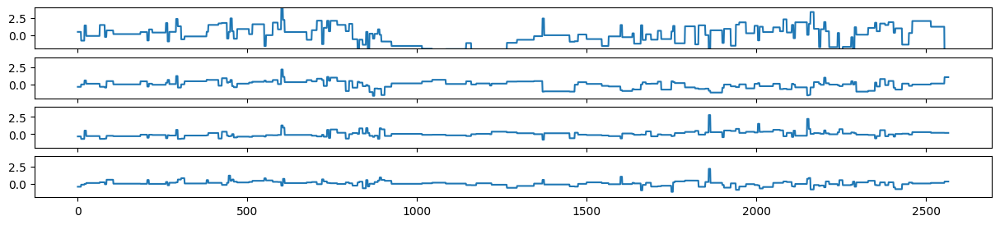

In [82]:
fig = plt.figure(figsize=(15,3))
ax = fig.add_subplot(411)
plt.plot(df_raw_pca[0])
plt.ylim(bottom=-2, top=4)
ax = fig.add_subplot(412)
plt.plot(df_raw_pca[1])
plt.ylim(bottom=-2, top=4)
ax = fig.add_subplot(413)
plt.plot(df_raw_pca[2])
plt.ylim(bottom=-2, top=4)
ax = fig.add_subplot(414)
plt.plot(df_raw_pca[3])
plt.ylim(bottom=-2, top=4)

# Unsupervised Machine learning

In [83]:
# with segmentation
X = df_raw_features#[['std', 'mean']]
X.columns = [0,1,2,3,4,5,6,7,8,9,10,11]

# without segmentation
#X = df_raw_outliers_removed
#X.columns = [0,1,2,3,4,5]

# PCA reducted features
X = df_raw_pca
X.columns = [0,1,2,3]

In [84]:
X

,0,1,2,3
0,0.469401,-0.325638,-0.343317,-0.460945
1,0.469401,-0.325638,-0.343317,-0.460945
2,0.469401,-0.325638,-0.343317,-0.460945
3,0.469401,-0.325638,-0.343317,-0.460945
4,0.469401,-0.325638,-0.343317,-0.460945
...,...,...,...,...
2562,-3.935114,1.080781,0.172481,0.294260
2563,-3.935114,1.080781,0.172481,0.294260
2564,-3.935114,1.080781,0.172481,0.294260
2565,-3.935114,1.080781,0.172481,0.294260


## K-Means

In [85]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

For n_clusters = 2 The average silhouette_score is : 0.4464345490570553
For n_clusters = 3 The average silhouette_score is : 0.38122068882248256
For n_clusters = 4 The average silhouette_score is : 0.3933684799141864
For n_clusters = 5 The average silhouette_score is : 0.3494348399530385
For n_clusters = 6 The average silhouette_score is : 0.34099501723833175
For n_clusters = 7 The average silhouette_score is : 0.3308957860937
For n_clusters = 8 The average silhouette_score is : 0.3186872391375297
For n_clusters = 9 The average silhouette_score is : 0.3106265335726546
For n_clusters = 10 The average silhouette_score is : 0.3033252775398057


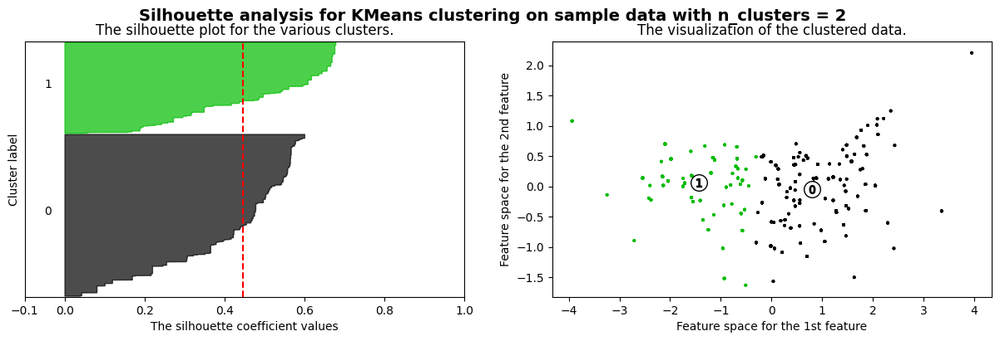

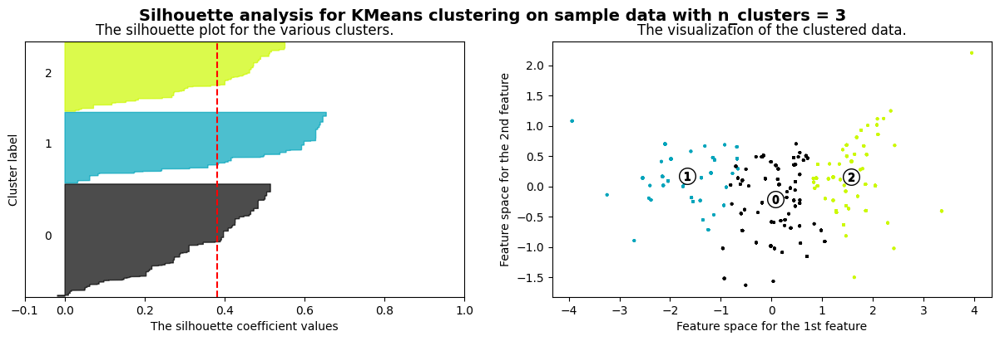

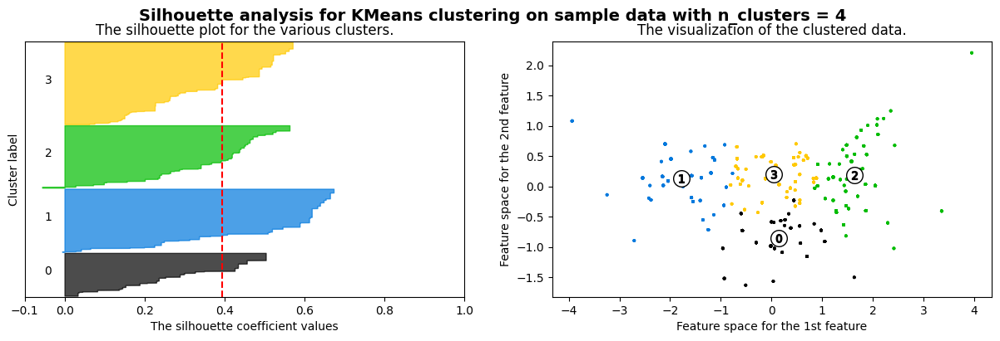

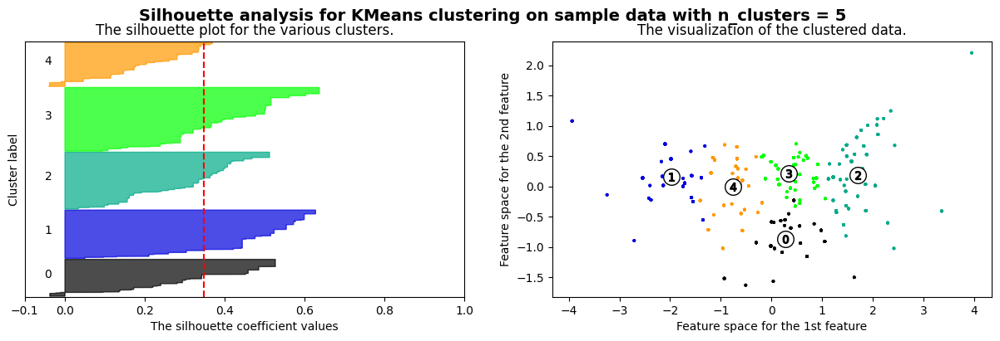

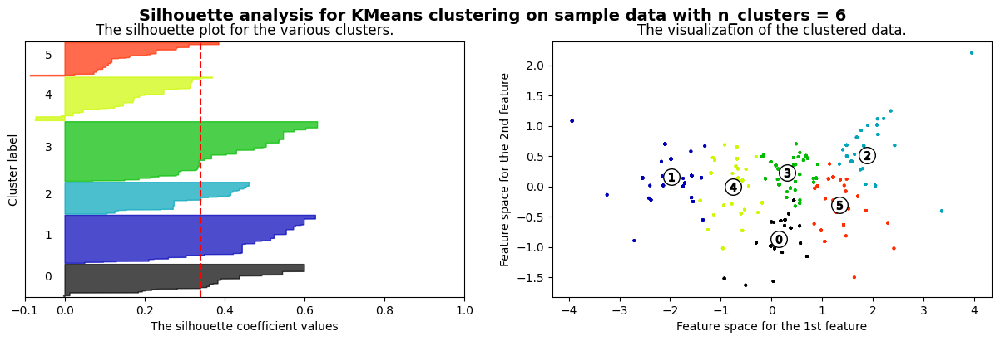

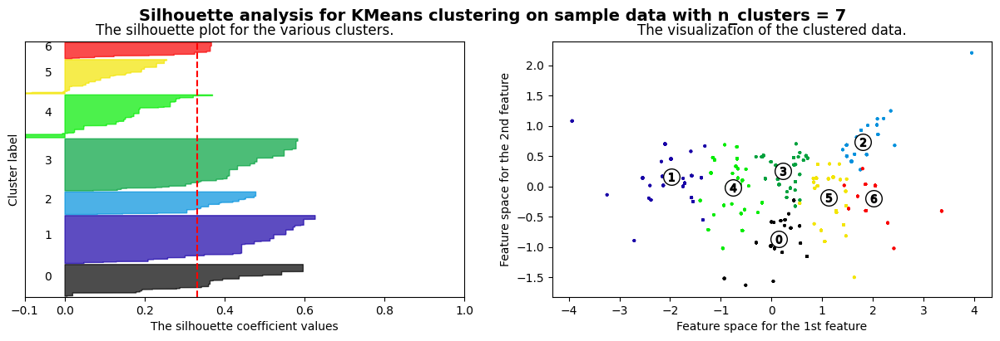

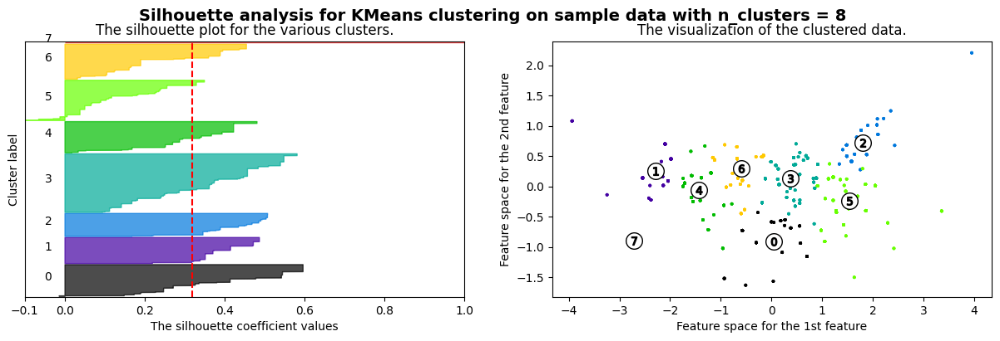

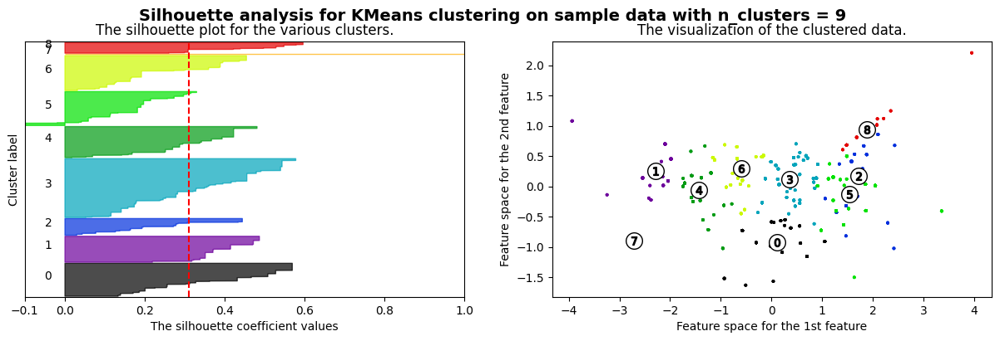

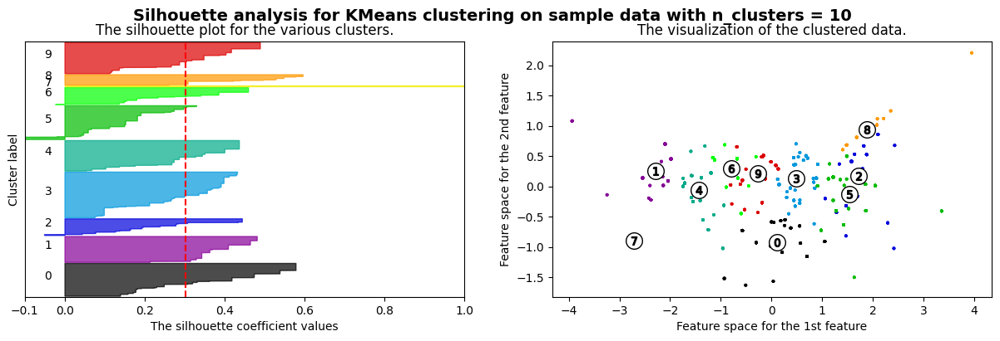

In [86]:
import matplotlib.cm as cm

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 4)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[0], X[1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Runtime: 

In [188]:
from sklearn.metrics import calinski_harabasz_score

In [412]:
kmeans = KMeans(n_clusters=5, random_state=10)
kmeans.fit_predict(X)

array([0, 0, 0, ..., 4, 4, 4], dtype=int32)

In [197]:
calinski_harabasz_score(X, kmeans.labels_)

1100.0641542139

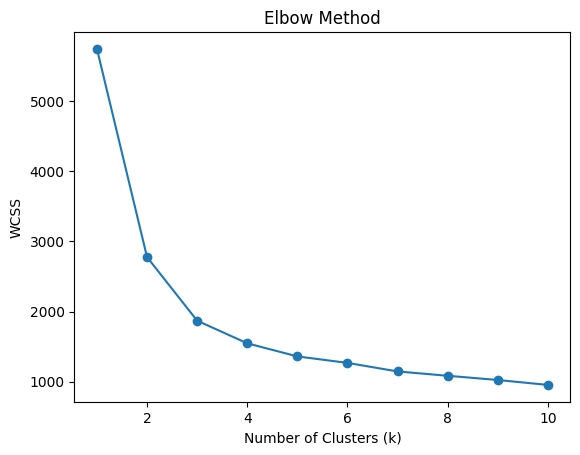

In [304]:
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
# Plot the elbow method
plt.plot(range(1, 11), wcss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()

In [414]:
clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(X)

In [353]:
kmeans_silhouette = silhouette_score(X, cluster_labels)

<Axes: >

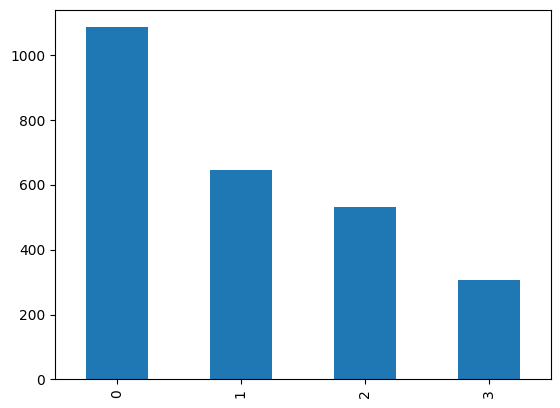

In [416]:
pd.Series(cluster_labels).value_counts().plot(kind='bar')

In [415]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

## Agglomerative clustering

In [202]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

For n_clusters = 2 The average silhouette_score is : 0.4266507416262507
For n_clusters = 3 The average silhouette_score is : 0.35651028103247623
For n_clusters = 4 The average silhouette_score is : 0.3472693639613042
For n_clusters = 5 The average silhouette_score is : 0.3293652209112894
For n_clusters = 6 The average silhouette_score is : 0.3235685453588395
For n_clusters = 7 The average silhouette_score is : 0.3437381787356242
For n_clusters = 8 The average silhouette_score is : 0.3132396516562417
For n_clusters = 9 The average silhouette_score is : 0.3198235580466688
For n_clusters = 10 The average silhouette_score is : 0.32635061504931595


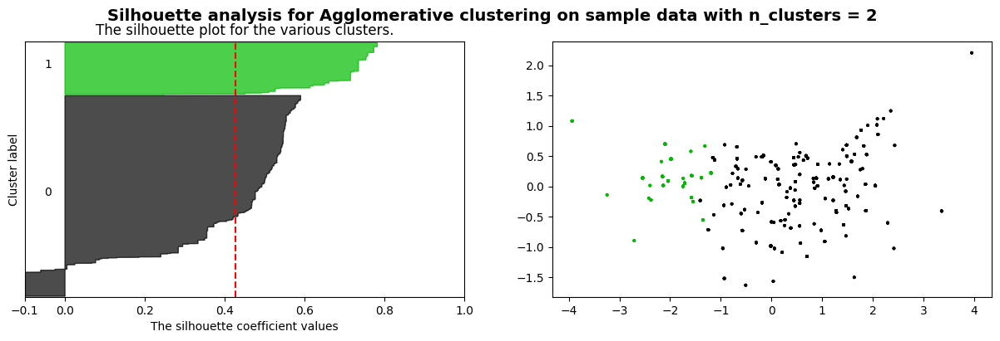

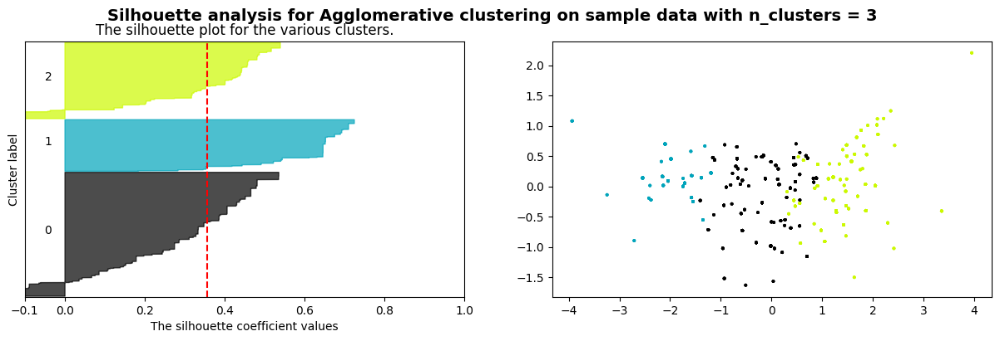

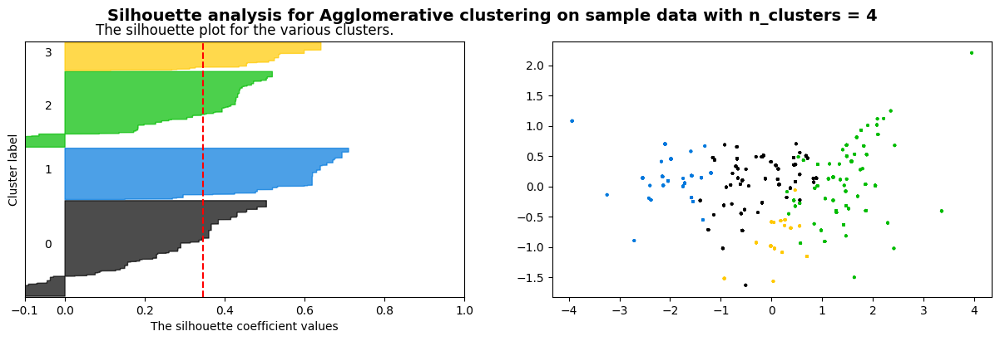

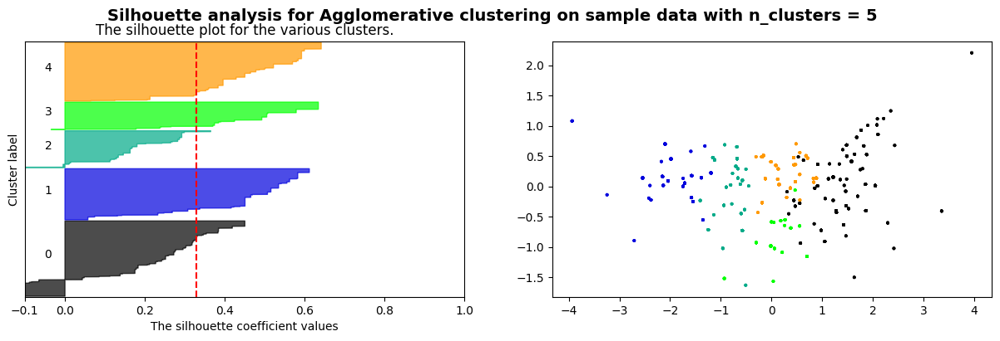

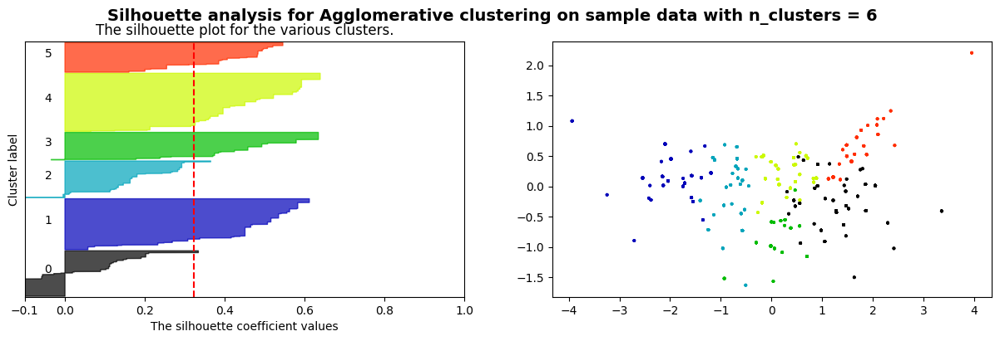

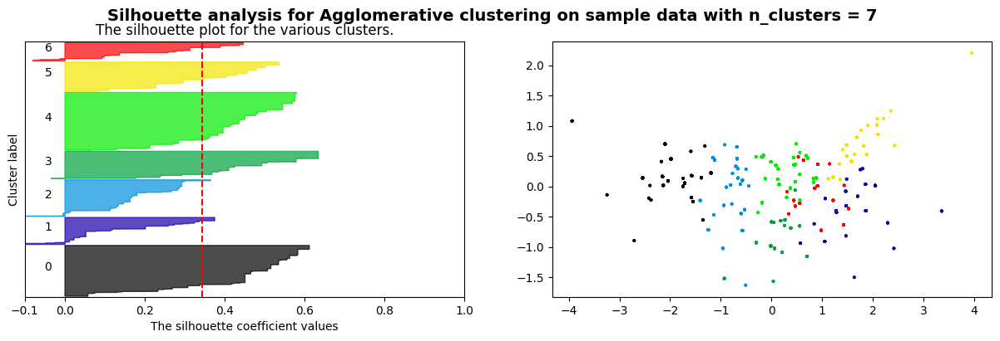

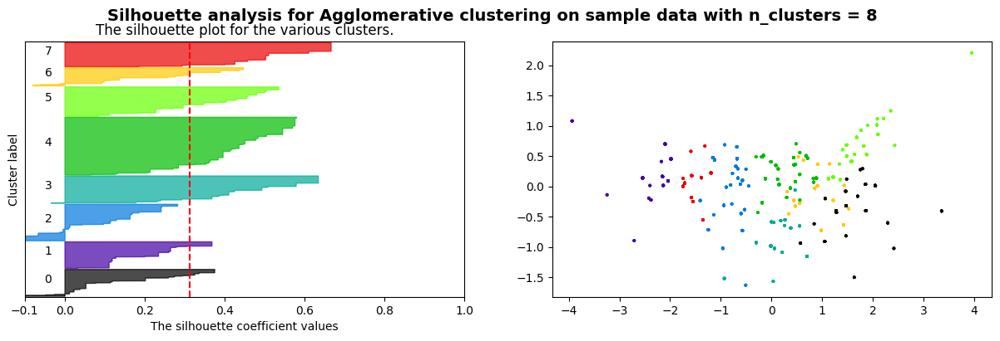

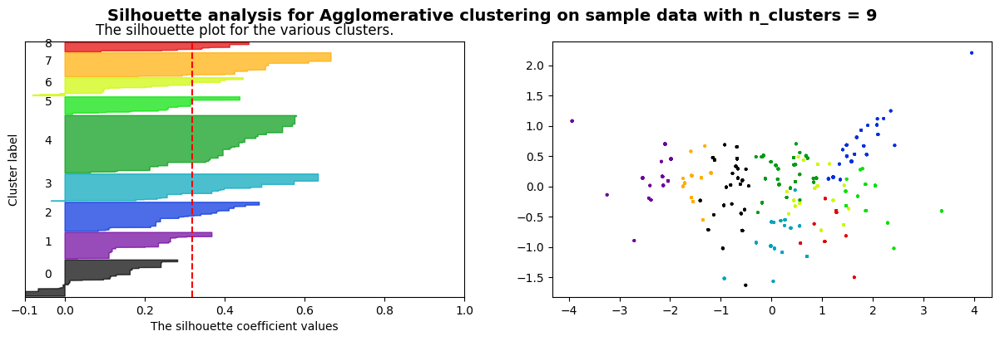

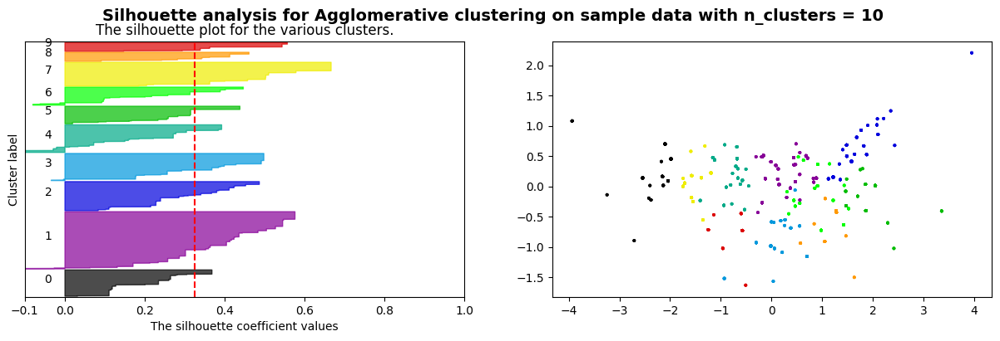

In [317]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 4)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[0], X[1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )
    """
    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    """
    plt.suptitle(
        "Silhouette analysis for Agglomerative clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Runtime: 

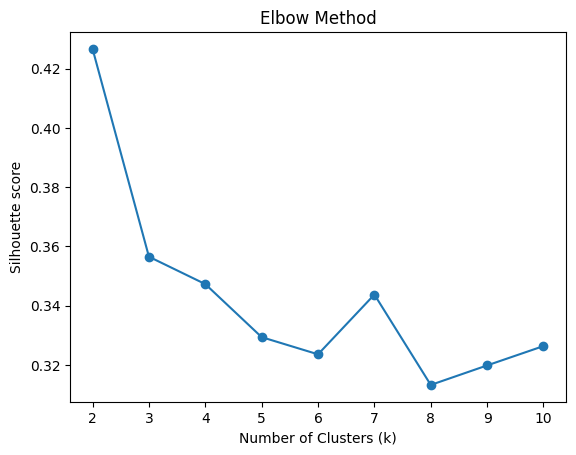

In [324]:
wcss = []
for k in range(2, 11):
    aggclus = AgglomerativeClustering(n_clusters=k)
    cluster_labels = aggclus.fit_predict(X)
    wcss.append(silhouette_score(X, cluster_labels))
# Plot the elbow method
plt.plot(range(2, 11), wcss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette score')
plt.title('Elbow Method')
plt.show()

In [349]:
clusterer = AgglomerativeClustering(n_clusters=4)
cluster_labels = clusterer.fit_predict(X)

In [351]:
agglomerative_silhouette = silhouette_score(X, cluster_labels)

<Axes: >

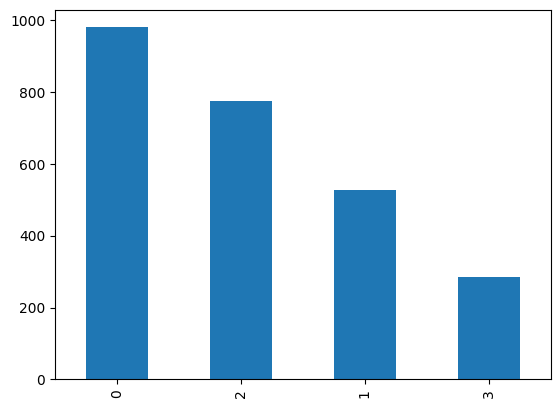

In [346]:
pd.Series(cluster_labels).value_counts().plot(kind='bar')

In [263]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

In [210]:
linkage_matrix = hierarchy.linkage(clusterer.children_)

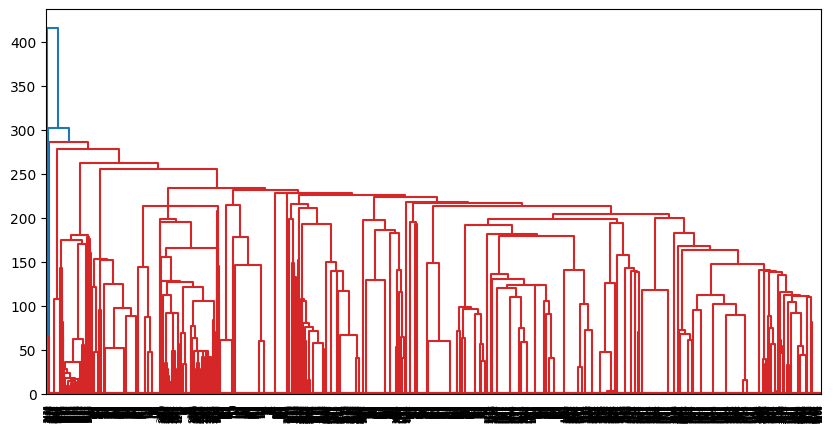

In [325]:
plt.figure(figsize=(10,5))
dn = hierarchy.dendrogram(linkage_matrix)
# Use this to determine the cluster (truncate) number

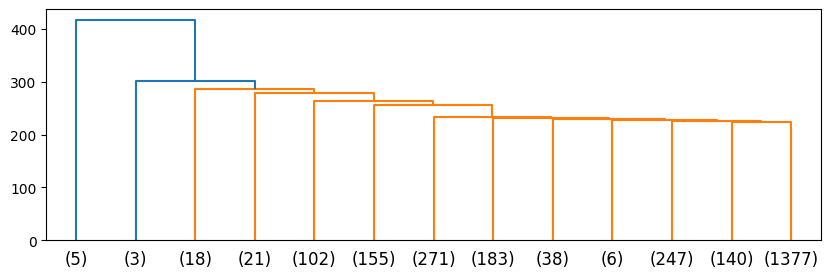

In [326]:
plt.figure(figsize=(10,3))
dn = hierarchy.dendrogram(linkage_matrix,truncate_mode='lastp',p=13)#'level',p=6)

<Axes: >

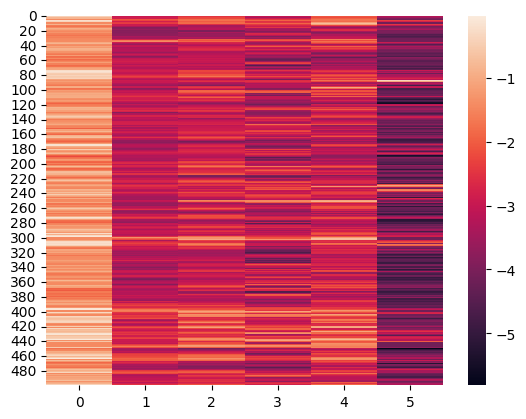

In [219]:
sns.heatmap(df_raw_outliers_removed[:500])

## Birch

In [220]:
from sklearn.cluster import Birch

For n_clusters = 2 The average silhouette_score is : 0.42252754944488746
For n_clusters = 3 The average silhouette_score is : 0.3481865048730133
For n_clusters = 4 The average silhouette_score is : 0.2881223572550307
For n_clusters = 5 The average silhouette_score is : 0.3193409283330308
For n_clusters = 6 The average silhouette_score is : 0.3048971676358178
For n_clusters = 7 The average silhouette_score is : 0.30562379407219115
For n_clusters = 8 The average silhouette_score is : 0.3054572982645009
For n_clusters = 9 The average silhouette_score is : 0.2733659171724432
For n_clusters = 10 The average silhouette_score is : 0.28002796435240324


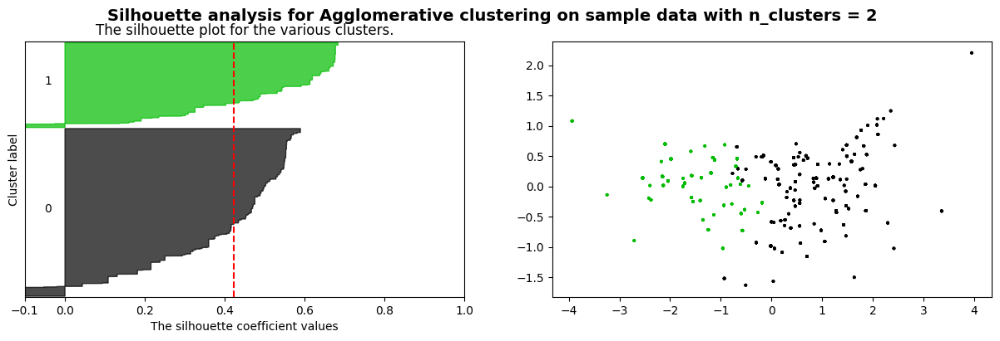

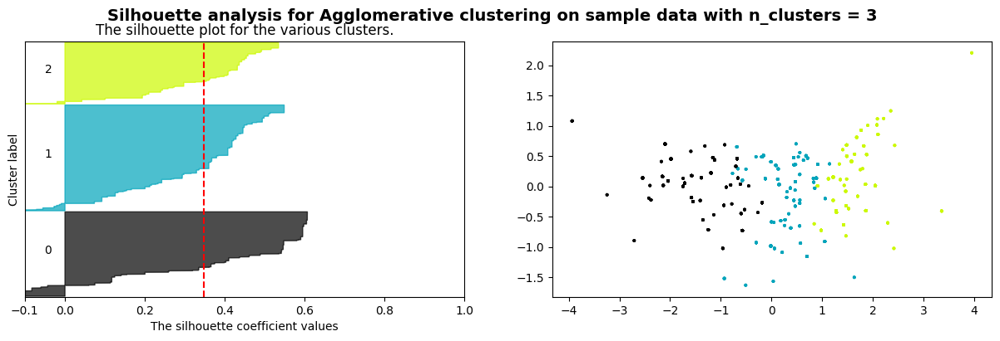

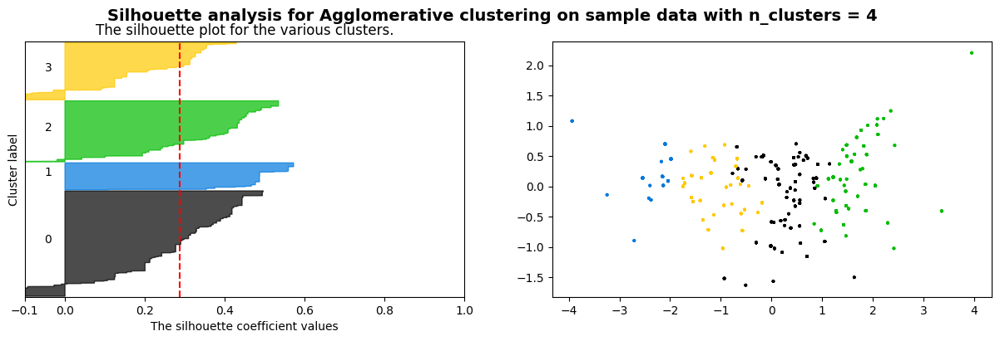

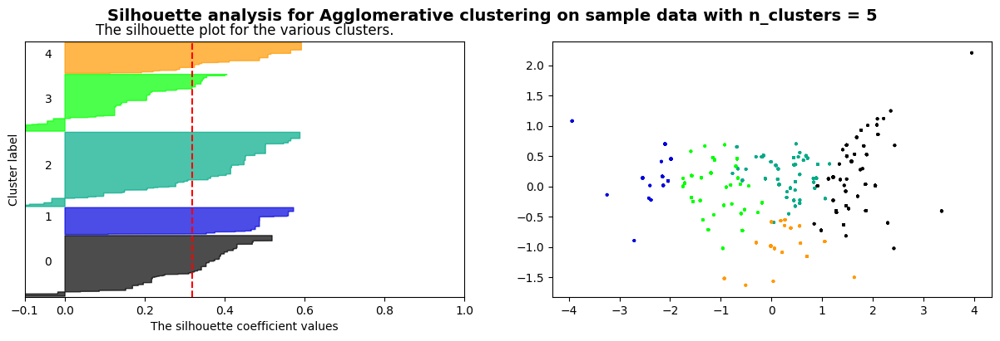

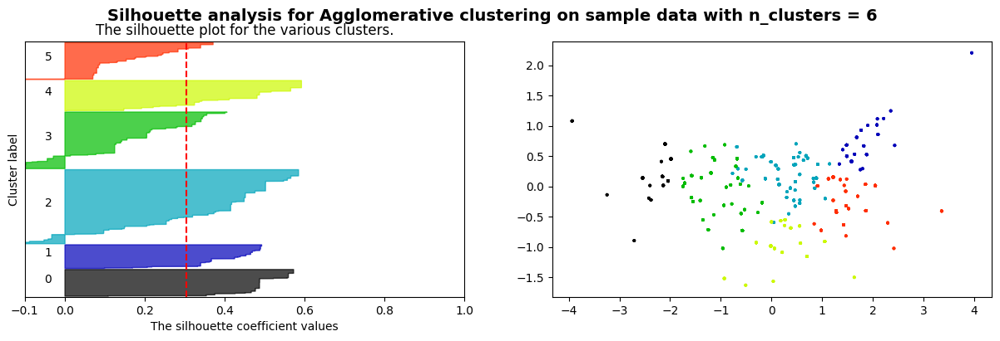

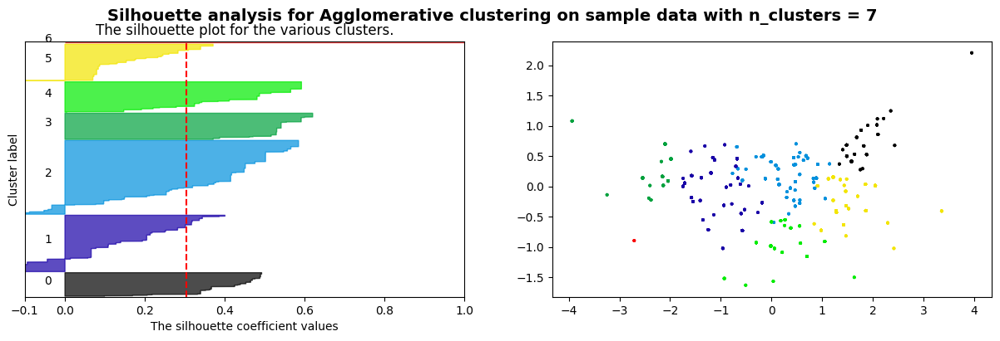

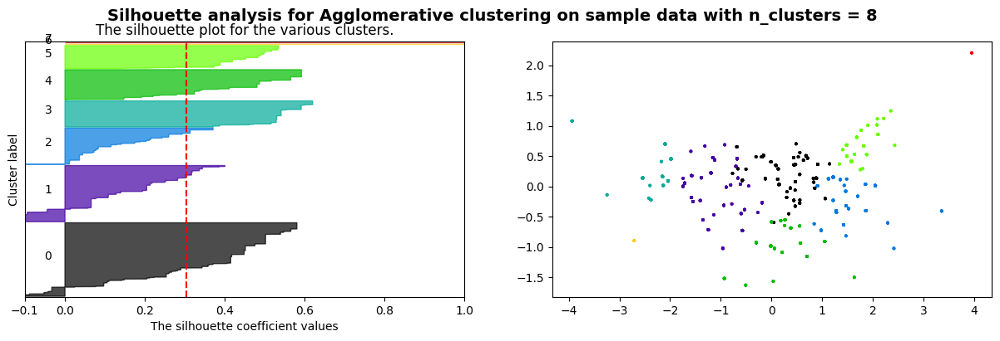

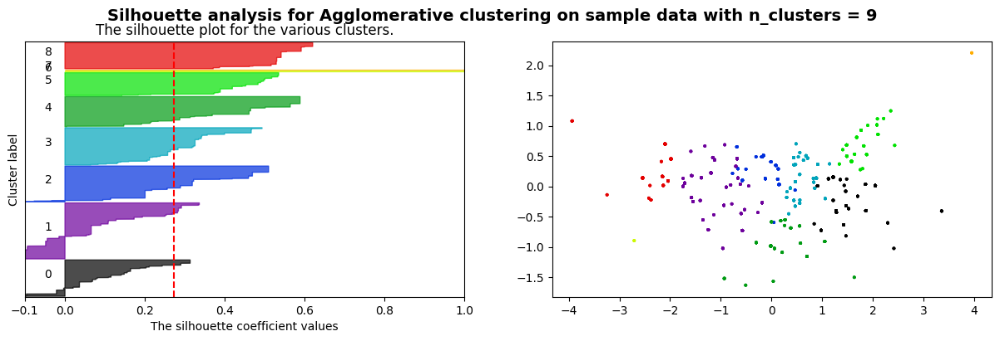

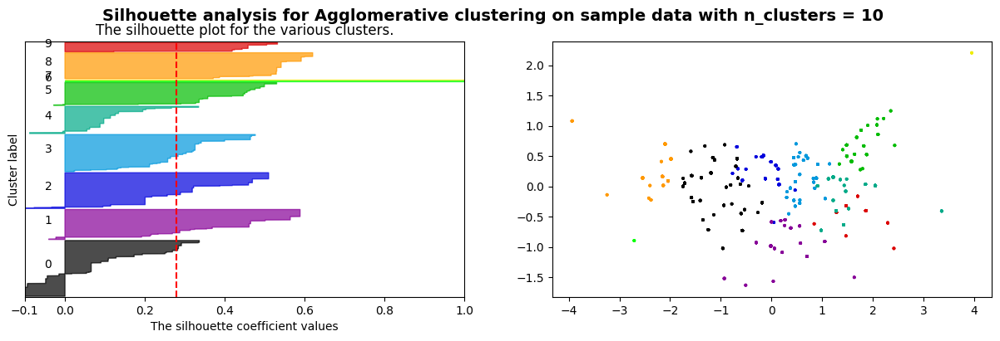

In [328]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 4)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = Birch(threshold=0.01, n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[0], X[1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )
    """
    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    """
    plt.suptitle(
        "Silhouette analysis for Agglomerative clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Runtime: 

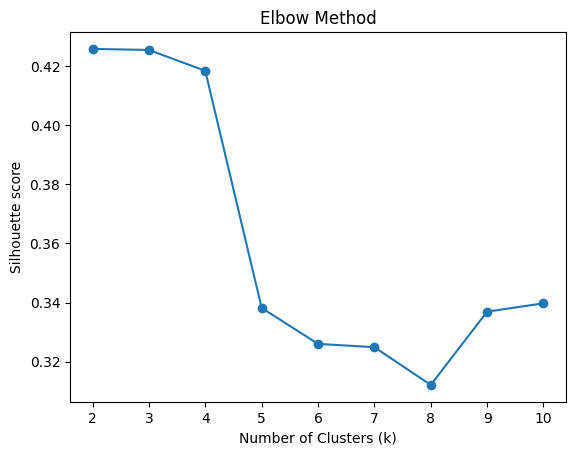

In [332]:
wcss = []
for k in range(2, 11):
    birchclus = Birch(threshold=0.5, n_clusters=k)
    cluster_labels = birchclus.fit_predict(X)
    wcss.append(silhouette_score(X, cluster_labels))
# Plot the elbow method
plt.plot(range(2, 11), wcss, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette score')
plt.title('Elbow Method')
plt.show()

In [354]:
birchclus = Birch(threshold=0.5, n_clusters=4)
cluster_labels = birchclus.fit_predict(X)

In [355]:
birch_silhouette = silhouette_score(X, cluster_labels)

<Axes: >

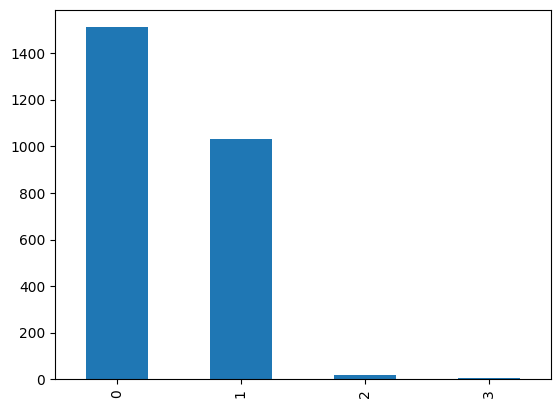

In [340]:
# the distribution of predicted labels are very uneven
pd.Series(cluster_labels).value_counts().plot(kind='bar')

In [334]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

## Mean Shift

In [309]:
from sklearn.cluster import MeanShift

In [356]:
clusterer = MeanShift()
cluster_labels = clusterer.fit_predict(X)
np.unique(cluster_labels)

array([0, 1, 2, 3, 4, 5])

In [357]:
# Silhoutte score is low
meanshift_silhoutte = silhouette_score(X, cluster_labels)

In [311]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

## Summary

In [ ]:
kmeans_silhouette
agglomerative_silhouette
birch_silhouette
meanshift_silhoutte

In [358]:
pd.Series([kmeans_silhouette, agglomerative_silhouette])

0    0.393368
1    0.347269
dtype: float64

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_67431/504131998.py:3: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



[Text(0, 0, 'kmeans'),
 Text(1, 0, 'agglomerative'),
 Text(2, 0, 'birch'),
 Text(3, 0, 'meanshift')]

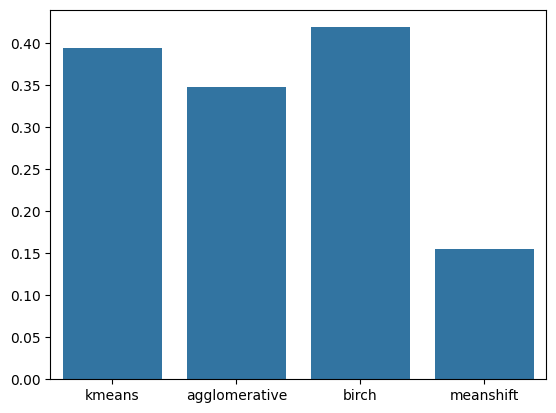

In [374]:
fig, ax = plt.subplots()
sns.barplot(data=pd.Series([kmeans_silhouette, agglomerative_silhouette, birch_silhouette, meanshift_silhoutte]))
ax.set_xticklabels(['kmeans', 'agglomerative', 'birch', 'meanshift'])

## Final model

In [ ]:
# Optimal number of classes is between 4 and 6

# Future tasks: Search feature extraction methods and try another unsupervised learner models

In [87]:
clusterer = KMeans(n_clusters=4, random_state=10)
cluster_labels = clusterer.fit_predict(X)

In [91]:
cluster_labels[cluster_labels == 2] = 5
cluster_labels[cluster_labels == 0] = 2
cluster_labels[cluster_labels == 5] = 0

In [94]:
cluster_labels[cluster_labels == 1] = 10
cluster_labels[cluster_labels == 3] = 1
cluster_labels[cluster_labels == 10] = 3

In [382]:
cluster_labels[cluster_labels == 1] = 15
cluster_labels[cluster_labels == 0] = 1
cluster_labels[cluster_labels == 15] = 0

In [391]:
cluster_labels[cluster_labels == 1] = 20
cluster_labels[cluster_labels == 2] = 1
cluster_labels[cluster_labels == 20] = 2

In [385]:
df_raw_outliers_removed

,0,1,2,3,4,5
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712
...,...,...,...,...,...,...
2572,-2.859729,-5.080092,-3.325959,-5.243603,-4.756296,-7.501328
2573,-2.778249,-5.095397,-3.237691,-5.172530,-4.636259,-7.815250
2574,-2.710008,-5.130247,-3.233699,-5.207230,-4.630913,-7.815250
2575,-2.576098,-5.165266,-3.207332,-5.232288,-4.506049,-6.712545


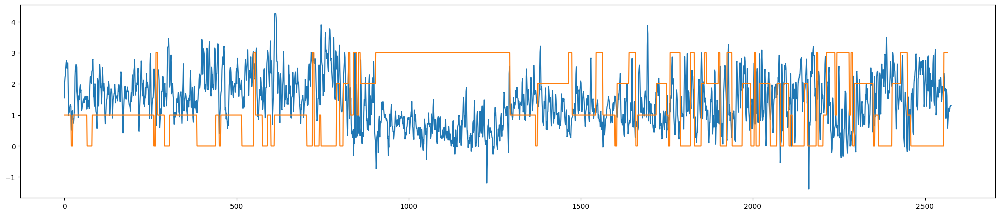

In [449]:
plt.figure(figsize=(25,5))
plt.plot(df_raw_outliers_removed['acc_z'] + 4.5)
plt.plot(cluster_labels)

In [140]:
final = pd.concat([df_outliers_removed, df_pca, pd.Series(cluster_labels), df_sum_spectrum['lat'], df_sum_spectrum['lon']], axis=1, ignore_index=True)

In [142]:
final.dropna(inplace=True)

In [143]:
print(final[final[10]==0][2].median())
print(final[final[10]==1][2].median())
print(final[final[10]==2][2].median())
print(final[final[10]==3][2].median())

-2.6128896313734806
-2.9587543092906197
-3.1556804371922498
-3.7779638136271374


<Axes: >

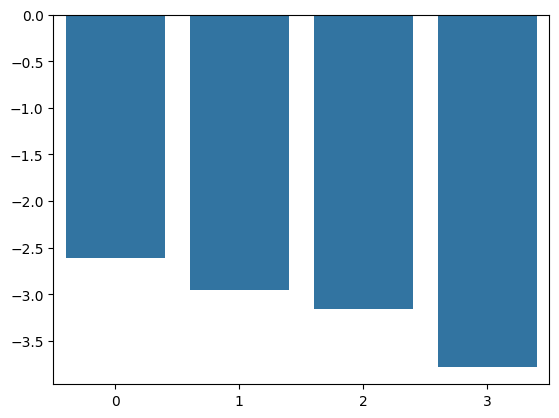

In [144]:
# Median acceleration value per pavement class
sns.barplot(data=[final[final[10]==0][2].median(), final[final[10]==1][2].median(), final[final[10]==2][2].median(), final[final[10]==3][2].median()])

In [448]:
fig = px.scatter_mapbox(lat=df_raw_sum_spectrum['lat'].iloc[10:], lon=df_raw_sum_spectrum['lon'].iloc[10:], color = cluster_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

## Export

In [145]:
final

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853,0.469401,-0.325638,-0.343317,-0.460945,1.0,46.899810,16.857534
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437,0.469401,-0.325638,-0.343317,-0.460945,1.0,46.899785,16.857527
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656,0.469401,-0.325638,-0.343317,-0.460945,1.0,46.899758,16.857519
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496,0.469401,-0.325638,-0.343317,-0.460945,1.0,46.899730,16.857511
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712,0.469401,-0.325638,-0.343317,-0.460945,1.0,46.899703,16.857503
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2562,-1.428735,-1.754741,-3.216445,-2.561249,-1.506702,-4.142829,-3.935114,1.080781,0.172481,0.294260,3.0,46.825737,16.829406
2563,-1.428735,-1.688018,-2.686162,-1.801369,-1.230126,-4.142829,-3.935114,1.080781,0.172481,0.294260,3.0,46.825791,16.829311
2564,-1.428735,-1.343105,-2.901990,-2.062314,-1.885629,-4.142829,-3.935114,1.080781,0.172481,0.294260,3.0,46.825845,16.829305
2565,-1.428735,-1.120325,-3.763930,-3.767383,-2.779588,-4.142829,-3.935114,1.080781,0.172481,0.294260,3.0,46.825878,16.829328


In [102]:
final.to_csv('./../../Data_phone/unsup_labelled_data.csv', index=False)

In [104]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score, ConfusionMatrixDisplay, roc_auc_score

In [146]:
ml = final.drop_duplicates(subset=6)


X = ml[[6,7,8,9]]
y = ml[10]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [148]:
model = RandomForestClassifier(n_estimators=2,random_state=101)

In [149]:
model.fit(X_train,y_train)

RandomForestClassifier(n_estimators=2, random_state=101)

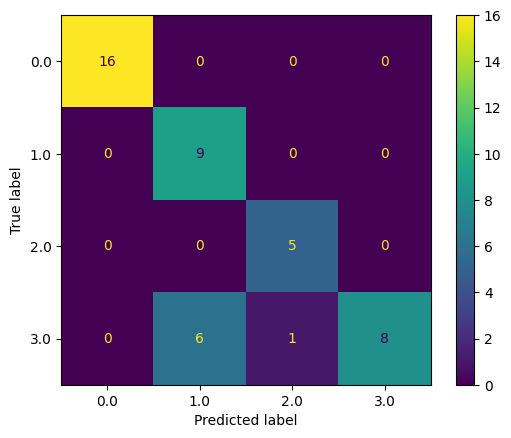

In [150]:
preds = model.predict(X_test)

cm = confusion_matrix(y_test, preds, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

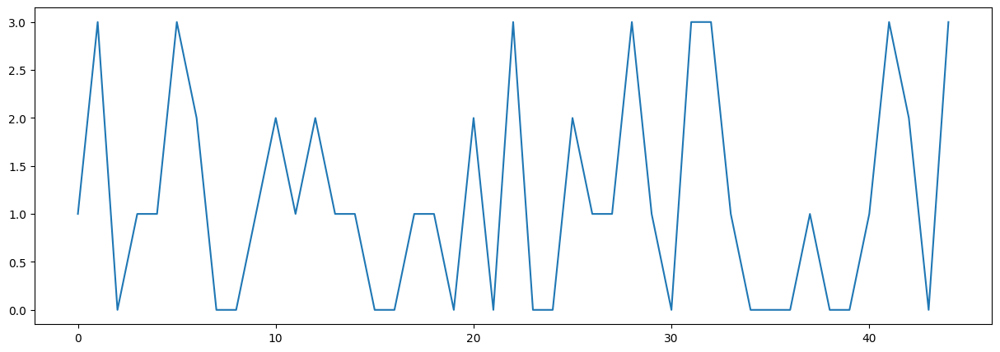

In [151]:
plt.figure(figsize=(15,5))
plt.plot(preds)